In [ ]:
from google.colab import drive
# Step 1: Mount Google Drive
drive.mount('/content/drive')
image_folder ='/content/drive/MyDrive/Images'

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity
from IPython.display import Image, display

In [ ]:
# Load dataset
df = pd.read_csv('Final Fashion Dataset.csv')

In [ ]:
# Encoding categorical features with OneHotEncoding
categorical_features = ['gender', 'baseColour', 'subCategory', 'articleType']
encoder = OneHotEncoder(sparse_output=False)
encoded_categorical = encoder.fit_transform(df[categorical_features])

In [ ]:
# Scaling numerical features
numerical_features = ['ratings', 'Price (USD)', 'year']
scaler = StandardScaler()
scaled_numerical = scaler.fit_transform(df[numerical_features])

In [ ]:
# Combining encoded and scaled features
combined_features = np.hstack([encoded_categorical, scaled_numerical])

# Creating a TF-IDF feature for product descriptions
tfidf = TfidfVectorizer(stop_words='english')
tfidf_matrix = tfidf.fit_transform(df['productDisplayName'].astype(str))

In [ ]:
# Concatenate all feature representations
final_features = np.hstack([combined_features, tfidf_matrix.toarray()])

In [ ]:
# Clustering with KMeans
'''
kmeans = KMeans(n_clusters=5, random_state=42)
df['cluster'] = kmeans.fit_predict(final_features)
'''

"\nkmeans = KMeans(n_clusters=5, random_state=42)\ndf['cluster'] = kmeans.fit_predict(final_features)\n"

In [ ]:
# Define complementary items with diverse categories
complementary_mapping = {
    'Skirts': ['Tshirts', 'Watches', 'Handbags', 'Heels'],
    'Tshirts': ['Jeans', 'Belts', 'Casual Shoes', 'Backpacks'],
    'Jeans': ['Shirts', 'Belts', 'Watches', 'Casual Shoes'],
    'Dresses': ['Heels', 'Clutches', 'Earrings', 'Watches'],
    'Shirts': ['Trousers', 'Formal Shoes', 'Belts', 'Watches'],
    'Kurtas': ['Leggings', 'Dupatta', 'Earrings', 'Sandals'],
    'Handbags': ['Tshirts', 'Jeans', 'Watches', 'Heels'],
    'Formal Shoes': ['Shirts', 'Trousers', 'Belts', 'Watches'],
    'Flip Flops': ['Shorts', 'Tshirts', 'Sunglasses'],
    'Heels': ['Dresses', 'Clutches', 'Necklace and Chains', 'Earrings'],
    'Leggings': ['Tops', 'Kurtas', 'Dupatta', 'Sandals'],
    'Backpacks': ['Tshirts', 'Jeans', 'Sneakers', 'Watches'],
    'Earrings': ['Dresses', 'Clutches', 'Heels', 'Watches'],
    'Clutches': ['Heels', 'Dresses', 'Earrings', 'Necklace and Chains'],
    'Casual Shoes': ['Jeans', 'Tshirts', 'Belts', 'Backpacks'],
    'Dupatta': ['Kurtas', 'Leggings', 'Sandals', 'Earrings'],
    'Tops': ['Skirts', 'Watches', 'Handbags', 'Heels'],
    'Ring': ['Dresses', 'Clutches', 'Necklace and Chains', 'Earrings'],
    'Flats': ['Shorts', 'Tops', 'Handbags', 'Sunglasses'],
    'Suspenders': ['Shirts', 'Trousers', 'Formal Shoes', 'Belts'],
    'Sports Shoes': ['Track Pants', 'Tshirts', 'Watches', 'Backpacks'],
    'Sunglasses': ['Tshirts', 'Jeans', 'Casual Shoes', 'Backpacks'],
    'Shorts': ['Tshirts', 'Flip Flops', 'Sunglasses', 'Backpacks'],
    'Belts': ['Jeans', 'Tshirts', 'Casual Shoes', 'Watches'],
    'Sarees': ['Handbags','Earrings', 'Necklace and Chains', 'Heels'],
    'Nightdress': ['Lounge Pants', 'Robe', 'Socks', 'Slippers'],
    'Jackets': ['Jeans', 'Tshirts', 'Sneakers', 'Backpacks'],
    'Trousers': ['Shirts', 'Formal Shoes', 'Belts', 'Watches'],
    'Messenger Bag': ['Tshirts', 'Jeans', 'Casual Shoes', 'Sunglasses'],
    'Track Pants': ['Sports Shoes', 'Tshirts', 'Watches', 'Backpacks'],
    'Kurtis': ['Leggings', 'Dupatta', 'Sandals', 'Earrings'],
    'Capris': ['Tshirts', 'Flip Flops', 'Sunglasses', 'Backpacks'],
    'Sweatshirts': ['Jeans', 'Sneakers', 'Backpacks', 'Watches'],
    'Wallets': ['Jeans', 'Shirts', 'Belts', 'Watches','Trousers'],
    'Socks': ['Sports Shoes', 'Track Pants', 'Tshirts', 'Backpacks'],
    'Necklace and Chains': ['Dresses', 'Earrings', 'Clutches', 'Heels'],
    'Stockings': ['Skirts', 'Heels', 'Handbags', 'Tops'],
    'Waist Pouch': ['Tshirts', 'Shorts', 'Sunglasses', 'Sneakers'],
    'Tunics': ['Leggings', 'Dupatta', 'Sandals', 'Earrings'],
    'Booties': ['Dresses', 'Leggings', 'Clutches', 'Necklace and Chains'],
    'Lounge Pants': ['Night Tshirts', 'Slippers', 'Robe', 'Socks'],
    'Sweaters': ['Jeans', 'Boots', 'Backpacks', 'Watches'],
    'Pendant': ['Tshirts', 'Jeans', 'Watches', 'Dresses','Necklace and Chains', 'Clutches'],
    'Duffel Bag': ['Sports Shoes', 'Track Pants', 'Tshirts', 'Watches'],
    'Tracksuits': ['Sports Shoes', 'Duffel Bag', 'Watches', 'Socks'],
    'Baby Dolls': ['Robes', 'Slippers', 'Socks', 'Nightgowns'],
    'Laptop Bag': ['Tshirts', 'Jeans', 'Sneakers', 'Watches'],
    'Night suits': ['Lounge Pants', 'Slippers', 'Robe', 'Socks'],
    'Tights': ['Tunics', 'Sweatshirts', 'Sneakers', 'Backpacks'],
    'Jeggings': ['Tops', 'Heels', 'Handbags', 'Sunglasses'],
    'Mobile Pouch': ['Jeans', 'Tshirts', 'Casual Shoes', 'Belts'],
    'Jewellery Set': ['Dresses', 'Earrings', 'Clutches', 'Heels'],
    'Lounge Shorts': ['Night Tshirts', 'Slippers', 'Robe', 'Socks'],
    #'Swimwear': ['Sunglasses', 'Flip Flops', 'Beach Bags'],
    'Swimwear': ['Sunglasses', 'Swimwear', 'Beach Bags'],
    'Bangle': ['Sarees', 'Necklace and Chains', 'Earrings', 'Sandals'],
    'Churidar': ['Kurtas', 'Dupatta', 'Sandals', 'Earrings'],
    'Salwar': ['Kurtas', 'Dupatta', 'Sandals', 'Earrings'],
    'Shrug': ['Tops', 'Jeans', 'Sneakers', 'Backpacks'],
    'Bracelet': ['Shirts','Jeans','Casual Shoes','Belts','Dresses', 'Necklace and Chains', 'Earrings', 'Watches'],
    'Waistcoat': ['Shirts', 'Trousers', 'Formal Shoes', 'Belts'],
    'Rucksacks': ['Tshirts', 'Jeans', 'Sneakers', 'Sunglasses'],
    'Blazers': ['Shirts', 'Trousers', 'Formal Shoes', 'Watches'],
    'Rompers': ['Sandals', 'Clutches', 'Earrings', 'Watches'],
    'Robe': ['Nightdress', 'Slippers', 'Socks', 'Night Tshirts'],
    'Salwar and Dupatta': ['Kurtas', 'Sandals', 'Earrings', 'Bangles'],
    'Tablet Sleeve': ['Tshirts', 'Jeans', 'Sneakers', 'Watches'],
    'Rain Jacket': ['Track Pants', 'Sports Shoes', 'Backpacks'],
    'Lounge Tshirts': ['Lounge Pants', 'Slippers', 'Robe', 'Socks'],
    'Lehenga Choli': ['Earrings', 'Necklace and Chains', 'Bangles', 'Sandals'],
    'Sandals': ['Skirts', 'Tops', 'Handbags', 'Sunglasses'],
    'Suits': ['Shirts', 'Trousers', 'Formal Shoes', 'Watches'],
    'Travel Accessory': ['Backpacks', 'Sneakers', 'Sunglasses'],
    'Trolley Bag': ['Casual Shoes', 'Jeans', 'Tshirts', 'Watches'],
    'Watches' : ['Shirts', 'Jeans', 'Tshirts', 'Shoes'],
    'Bangle' : ['Saree', 'Dresses', 'Necklace and Chains', 'Earrings']
}


In [ ]:
color_contrast_map = {
    'Black': ['White', 'Grey', 'Beige', 'Silver', 'Cream'],
    'Grey': ['Black', 'White', 'Red', 'Navy Blue'],
    'Blue': ['White', 'Cream', 'Yellow', 'Pink', 'Silver'],
    'Pink': ['Navy Blue', 'White', 'Beige', 'Grey'],
    'Brown': ['Cream', 'White', 'Beige', 'Olive', 'Mustard'],
    'Cream': ['Black', 'Blue', 'Brown', 'Navy Blue', 'Purple'],
    'Green': ['White', 'Black', 'Navy Blue', 'Yellow', 'Brown'],
    'White': ['Black', 'Blue', 'Red', 'Navy Blue', 'Grey'],
    'Navy Blue': ['White', 'Yellow', 'Cream', 'Pink', 'Beige'],
    'Yellow': ['Black', 'Navy Blue', 'Grey', 'Green', 'Purple'],
    'Silver': ['Black', 'Purple', 'Pink', 'Red'],
    'Red': ['White', 'Black', 'Grey', 'Beige'],
    'Beige': ['Navy Blue', 'Black', 'Red', 'Olive', 'Cream'],
    'Maroon': ['Cream', 'Beige', 'White', 'Olive'],
    'Gold': ['Black', 'White', 'Cream', 'Navy Blue'],
    'Magenta': ['Brown', 'Blue', 'Pink','Black'],
    'Lavender': ['Navy Blue', 'White', 'Grey'],
    'Multi': ['White', 'Black'],
    'Purple': ['Yellow', 'White', 'Cream'],
    'Charcoal': ['White', 'Cream', 'Blue'],
    'Orange': ['White', 'Black', 'Navy Blue'],
    'Tan': ['Navy Blue', 'White', 'Black'],
    'Olive': ['White', 'Yellow', 'Cream', 'Tan'],
    'Off White': ['Black', 'Grey', 'Navy Blue'],
    'Grey Melange': ['Black', 'White', 'Red', 'Blue'],
    'Rust': ['White', 'Cream', 'Beige', 'Navy Blue'],
    'Turquoise Blue': ['White', 'Black', 'Yellow'],
    'Mustard': ['White', 'Black', 'Brown', 'Navy Blue'],
    'Khaki': ['White', 'Navy Blue', 'Brown'],
    'Lime Green': ['White', 'Black', 'Grey'],
    'Peach': ['Blue', 'Black', 'Navy Blue'],
    'Sea Green': ['White', 'Black', 'Navy Blue'],
    'Teal': ['White', 'Cream', 'Navy Blue'],
    'Mauve': ['White', 'Grey', 'Blue'],
    'Copper': ['White', 'Black', 'Navy Blue'],
    'Steel': ['Black', 'White', 'Beige'],
    'Bronze': ['White', 'Black'],
    'Nude': ['White', 'Black', 'Beige'],
    'Metallic': ['White', 'Black', 'Silver'],
    'Taupe': ['White', 'Black', 'Beige'],
    'Fluorescent Green': ['White', 'Black'],
    'Burgundy': ['White', 'Beige', 'Grey'],
    'Mushroom Brown': ['White', 'Grey', 'Black'],
    'Coffee Brown': ['White', 'Beige', 'Cream']
}

In [ ]:
def get_diverse_complementary_recommendations(item_id, df, final_features, image_folder_path):
    try:
        item_idx = df.index[df['id'] == item_id][0]
    except IndexError:
        print("Item ID not found in dataset.")
        return []

    item_article_type = df.loc[item_idx, 'articleType']
    item_gender = df.loc[item_idx, 'gender']
    item_master_category = df.loc[item_idx, 'masterCategory']
    complementary_article_types = complementary_mapping.get(item_article_type, [])

    if not complementary_article_types:
        print("No complementary mapping found for the given item.")
        return []

    # Filter for items in the complementary article types and same gender, with different master category
    diverse_recommendations = []
    for article_type in complementary_article_types:
        type_specific_items = df[(df['articleType'] == article_type) &
                                 (df['gender'] == item_gender) &
                                 (df['masterCategory'] != item_master_category)]

        # If no items found, search for same gender in other rows
        if type_specific_items.empty:
            #print(f"No items found for {article_type} in the same gender. Searching for items in the same gender for {article_type}.")
            type_specific_items = df[(df['articleType'] == article_type) &
                                     (df['gender'] == item_gender)]

        if not type_specific_items.empty:
            complementary_features = final_features[type_specific_items.index]
            item_feature_vector = final_features[item_idx].reshape(1, -1)
            similarities = cosine_similarity(item_feature_vector, complementary_features).flatten()

            type_specific_items = type_specific_items.copy()
            type_specific_items['similarity'] = similarities
            top_item = type_specific_items.sort_values(by='similarity', ascending=False).iloc[0]
            diverse_recommendations.append(top_item)

    # Display recommendations
    for item in diverse_recommendations:
        item_id = item['id']
        filename = item['filename']
        similarity_score = item['similarity']

        image_path = f"{image_folder_path}/{filename}"
        gender_match = "Same Gender" if item['gender'] == item_gender else "Different Gender"
        print(f"Product ID: {item_id}, Similarity Score: {similarity_score:.4f}, Gender Match: {gender_match}")
        display(Image(filename=image_path, width=150, height=150))

Product ID: 2244, Similarity Score: 0.6672, Gender Match: Same Gender


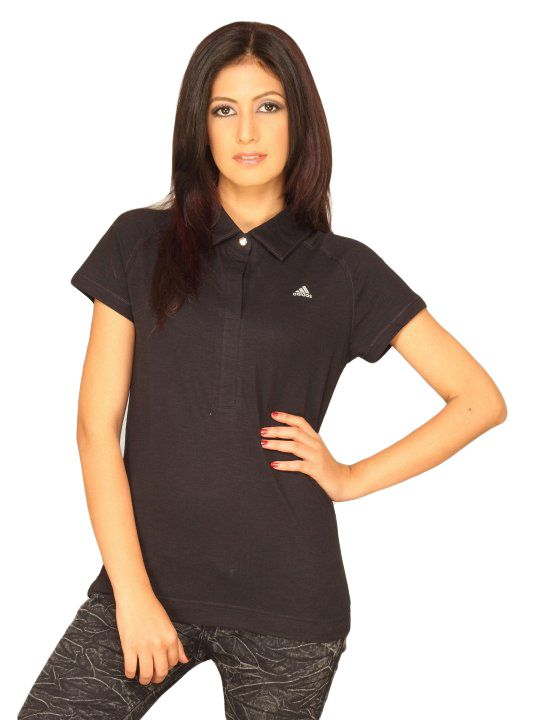

Product ID: 19292, Similarity Score: 0.3944, Gender Match: Same Gender


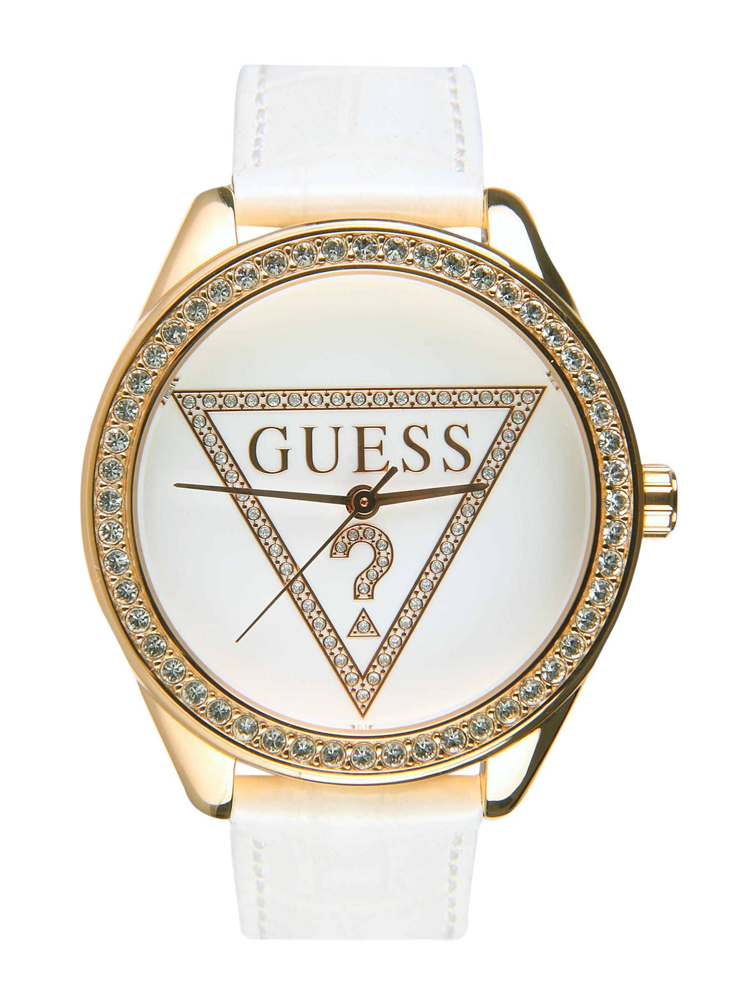

Product ID: 14886, Similarity Score: 0.6494, Gender Match: Same Gender


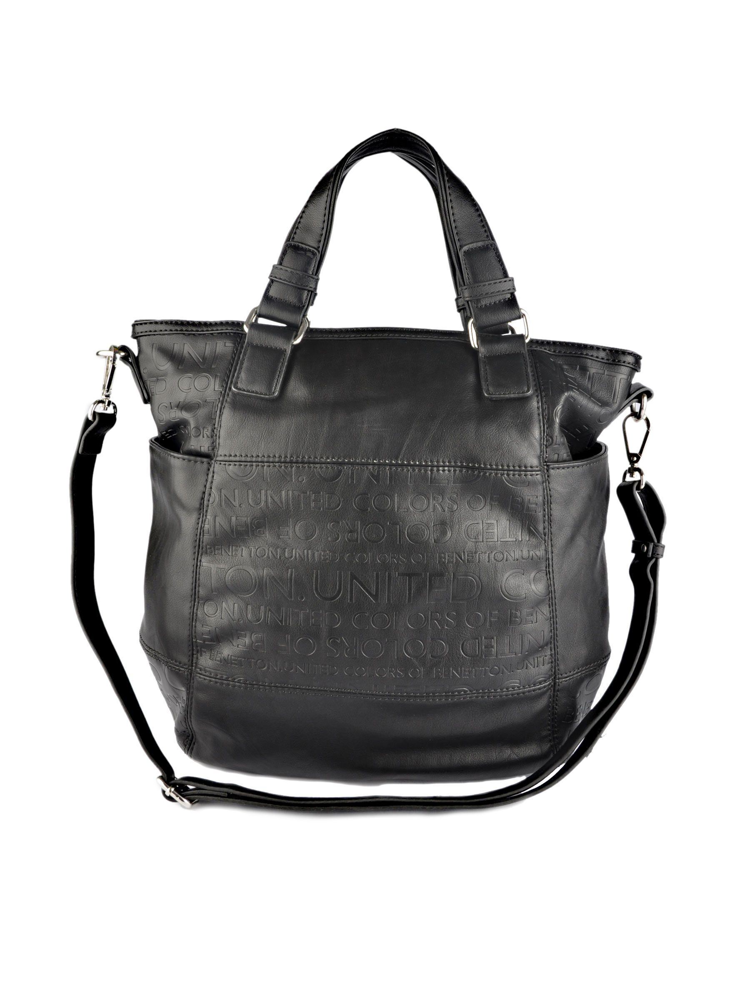

Product ID: 25017, Similarity Score: 0.6460, Gender Match: Same Gender


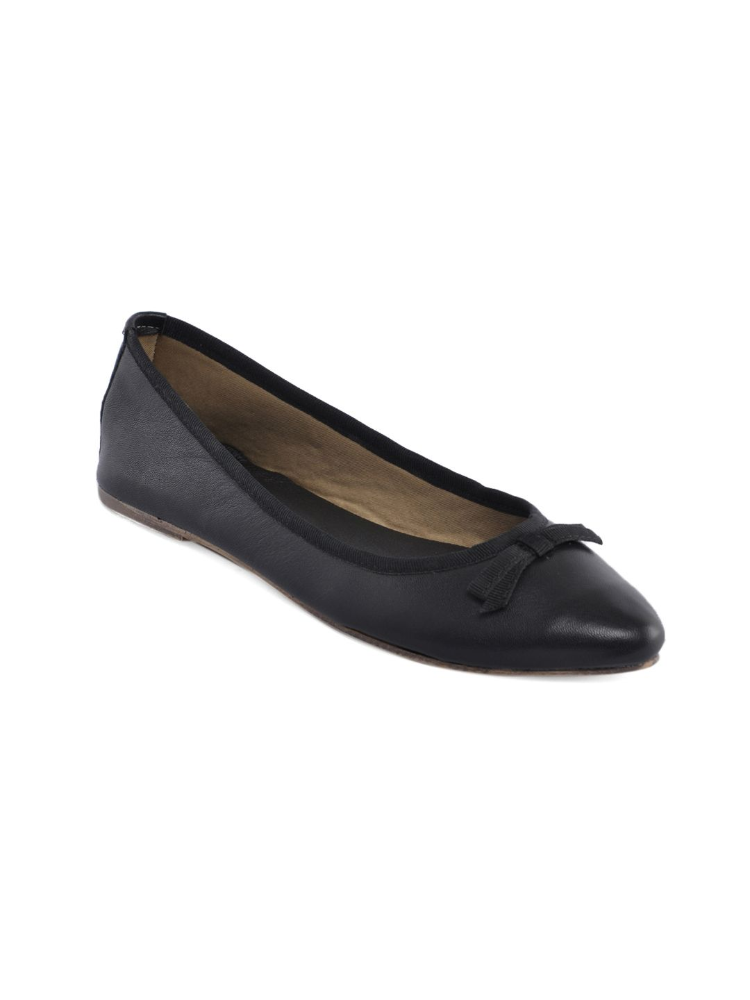

In [ ]:
# Example usage with an item ID
# Note: 'final_features' would need to be provided here; assuming it is ready
#image_folder_path = '/content/drive/MyDrive/Images'
item_id =8493   # Example item ID for a skirt
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder)


No items found for Watches in the same gender. Searching for items in the same gender for Watches.
Product ID: 19669, Similarity Score: 0.5530, Gender Match: Same Gender


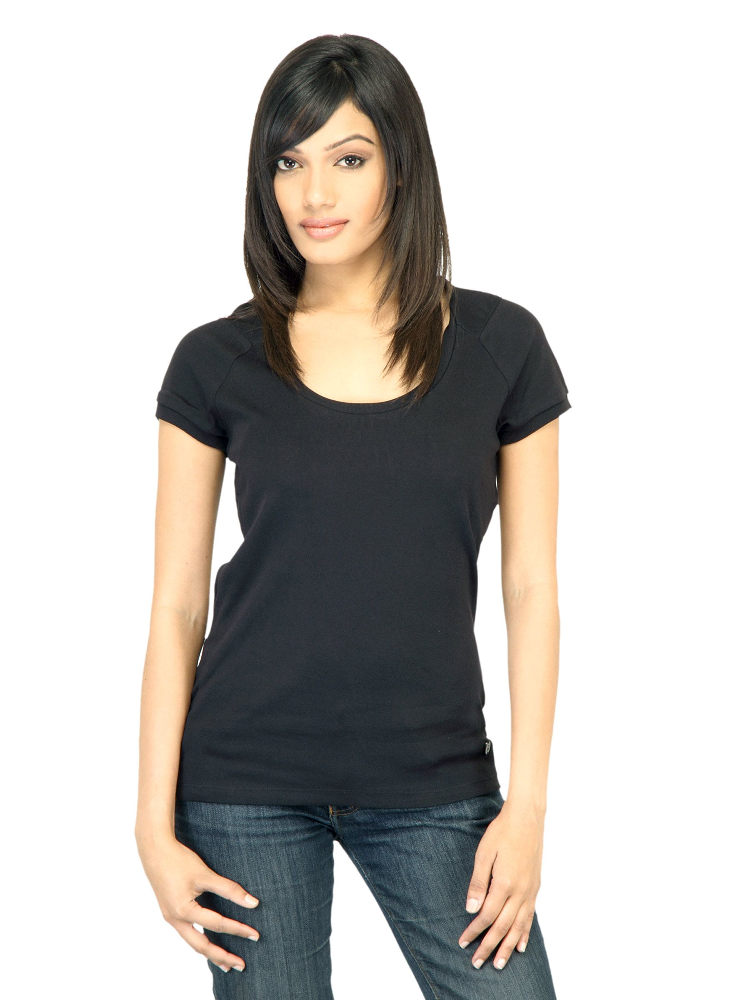

Product ID: 11317, Similarity Score: 0.5730, Gender Match: Same Gender


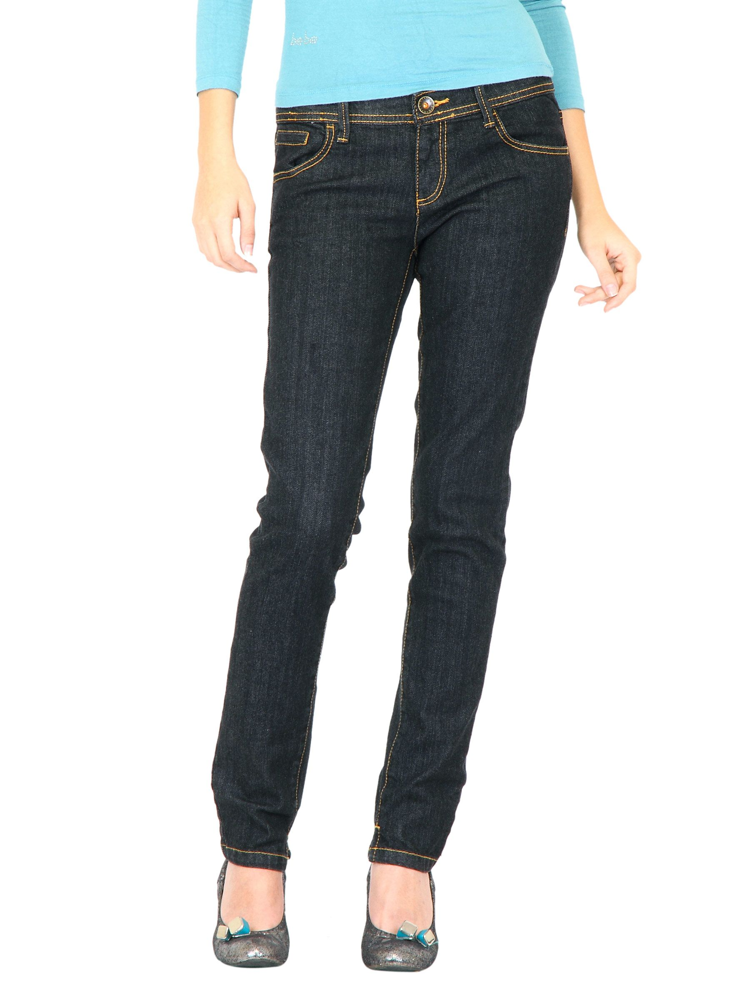

Product ID: 19264, Similarity Score: 0.3262, Gender Match: Same Gender


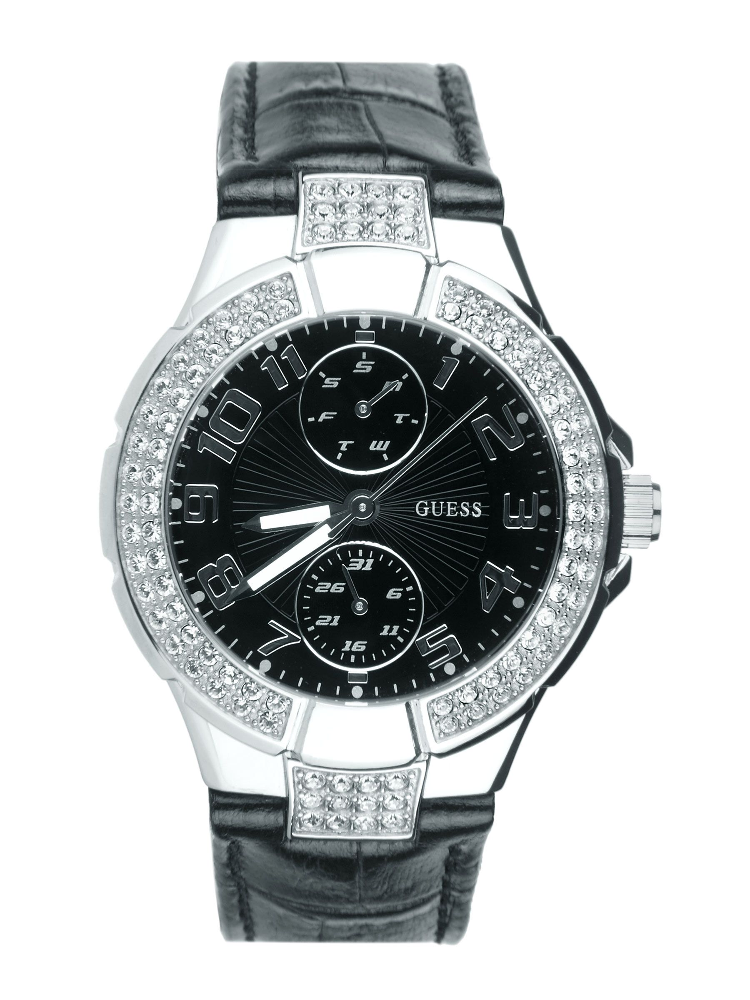

Product ID: 15523, Similarity Score: 0.5150, Gender Match: Same Gender


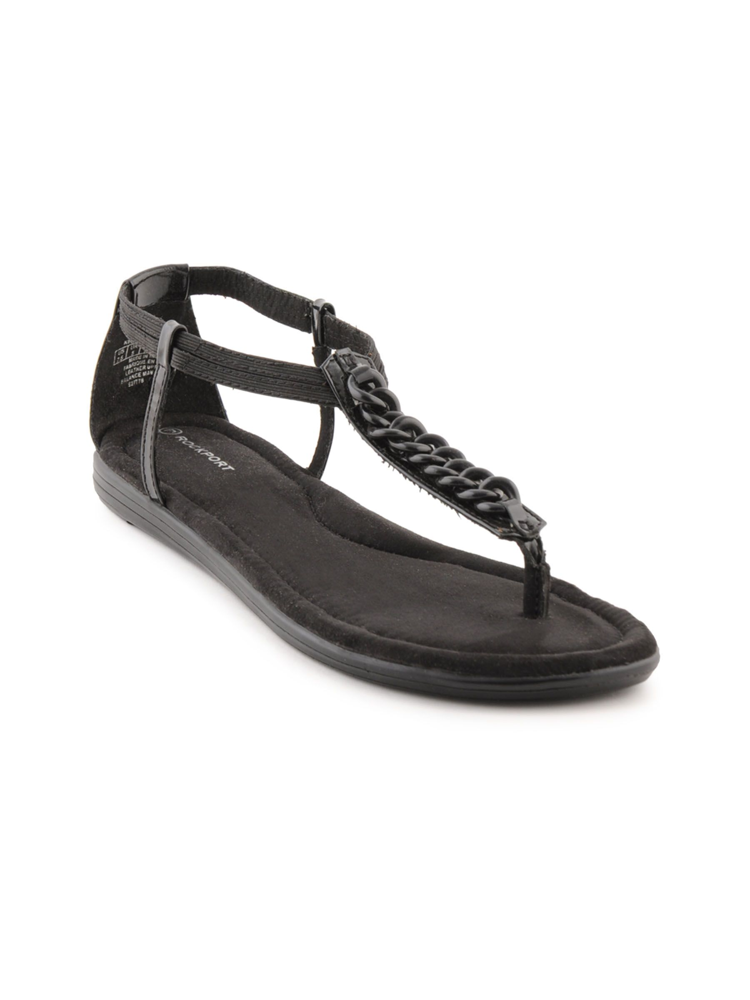

In [ ]:
item_id= 14881 #Hanbag
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder)

Product ID: 27430, Similarity Score: 0.4987, Gender Match: Same Gender


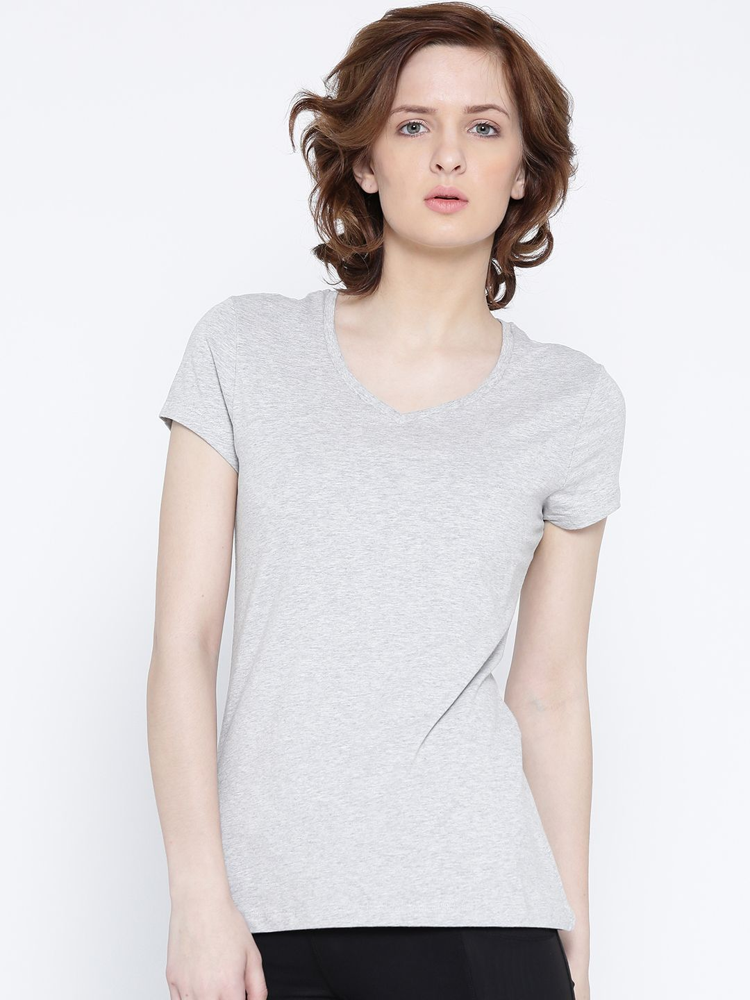

Product ID: 9141, Similarity Score: 0.2260, Gender Match: Same Gender


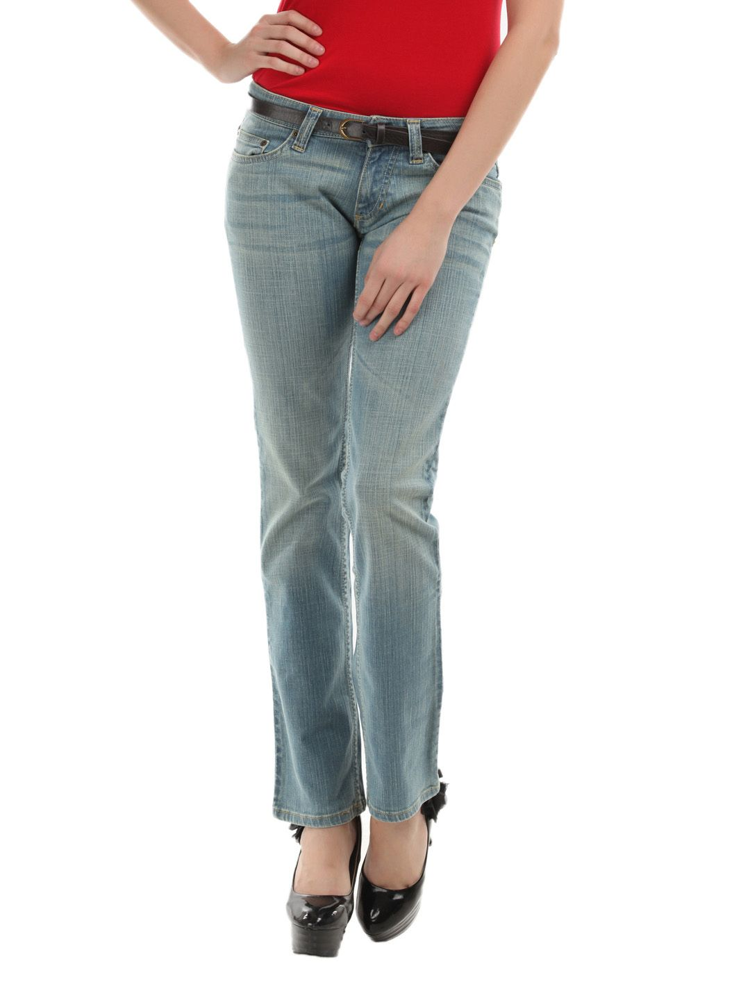

Product ID: 25637, Similarity Score: 0.6409, Gender Match: Same Gender


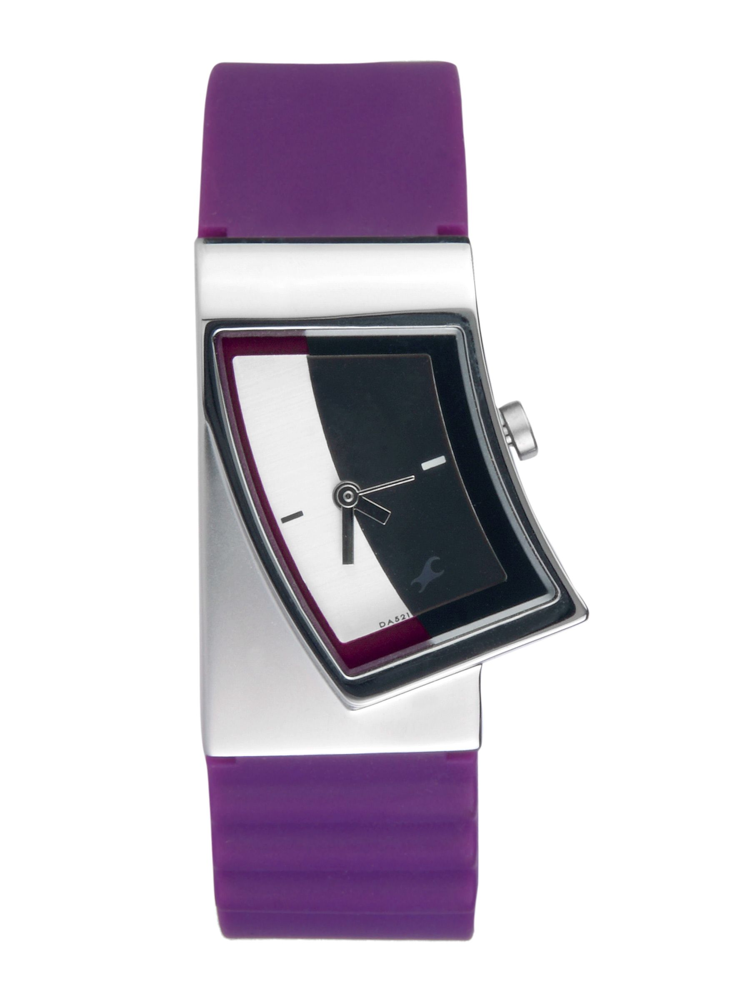

Product ID: 43648, Similarity Score: 0.0964, Gender Match: Same Gender


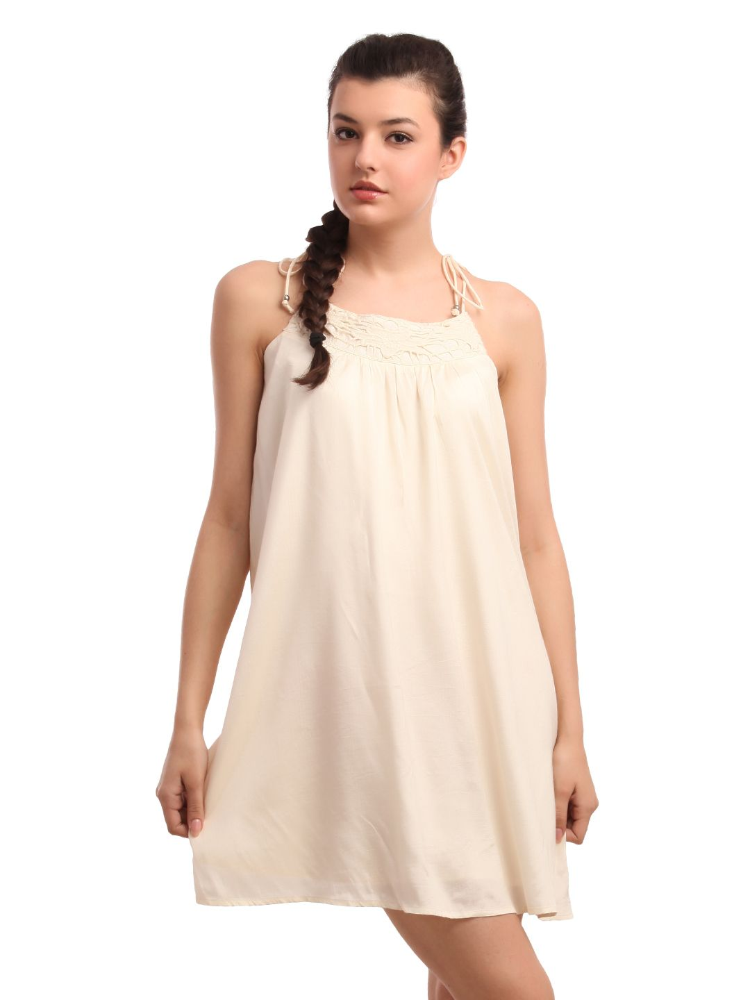

Product ID: 53088, Similarity Score: 0.7463, Gender Match: Same Gender


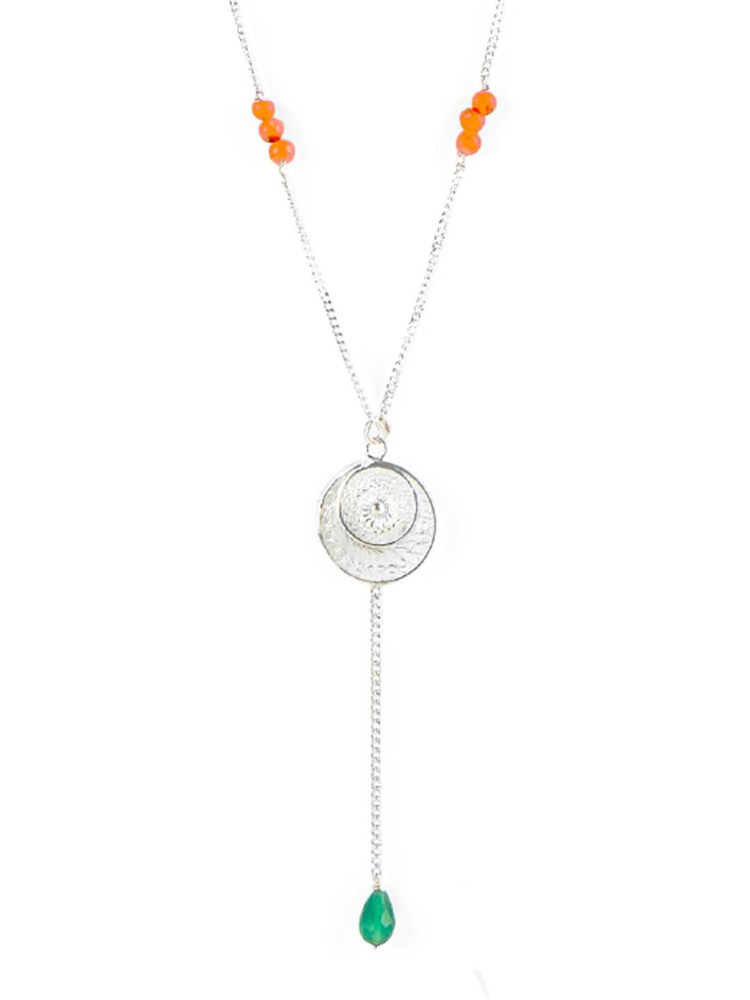

Product ID: 21980, Similarity Score: 0.5987, Gender Match: Same Gender


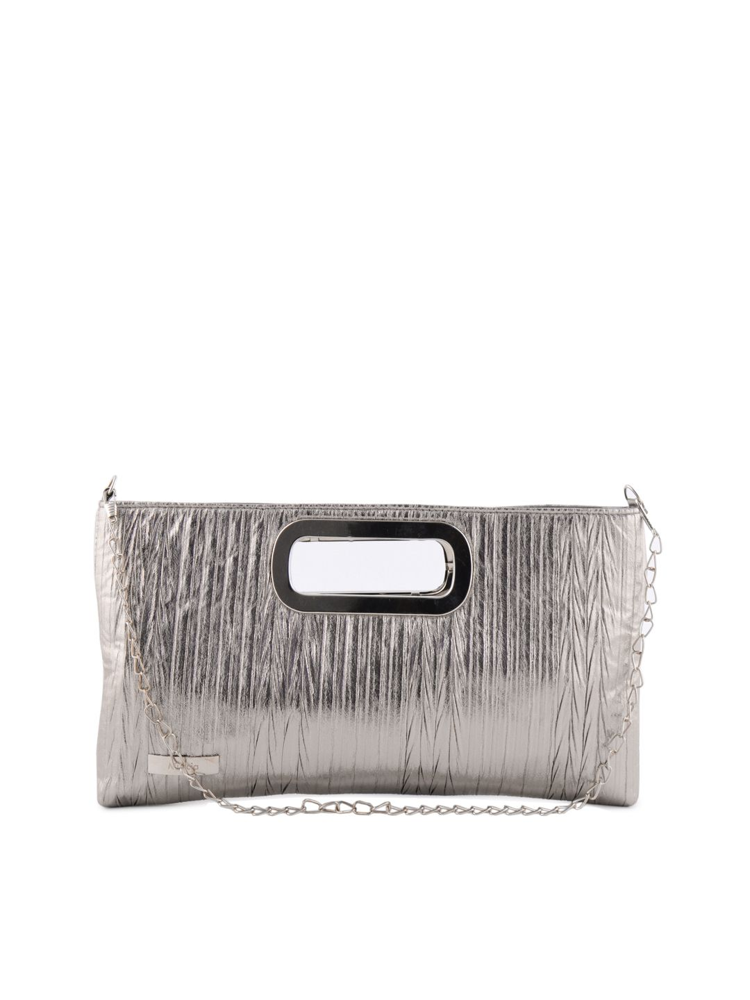

In [ ]:
item_id=48801 #Pendant for women
#item_id = 59563 pendant for men
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder)

Product ID: 43481, Similarity Score: 0.6416, Gender Match: Same Gender


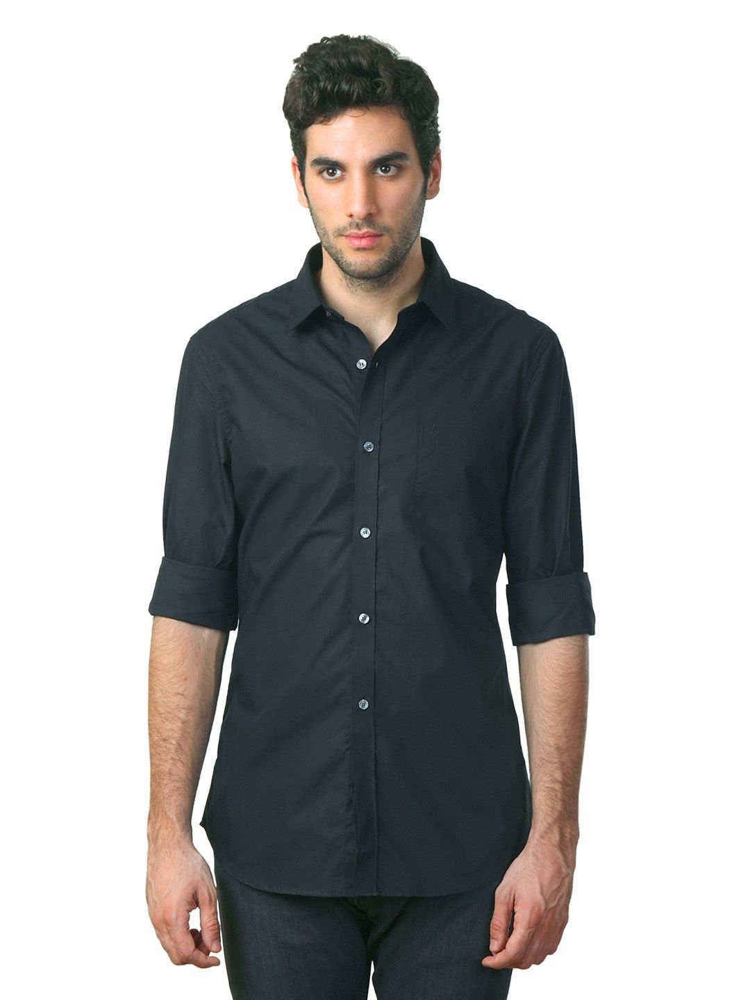

Product ID: 11339, Similarity Score: 0.6211, Gender Match: Same Gender


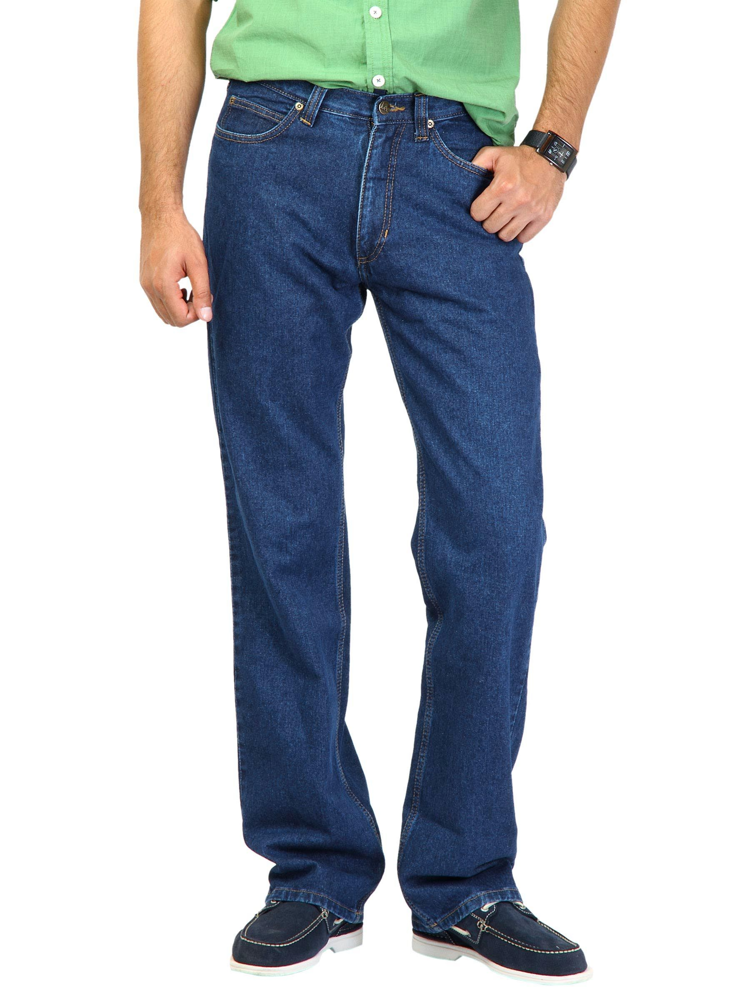

Product ID: 4412, Similarity Score: 0.7041, Gender Match: Same Gender


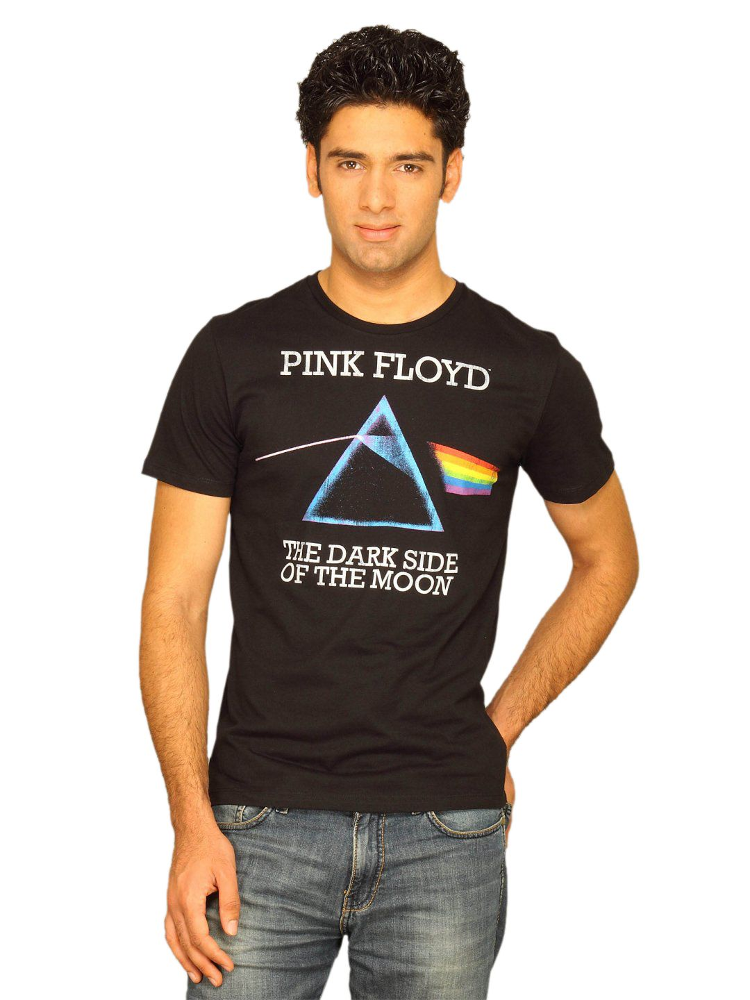

In [ ]:
item_id =33914 # watches-men
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder_path)

Product ID: 44672, Similarity Score: 0.2677, Gender Match: Same Gender


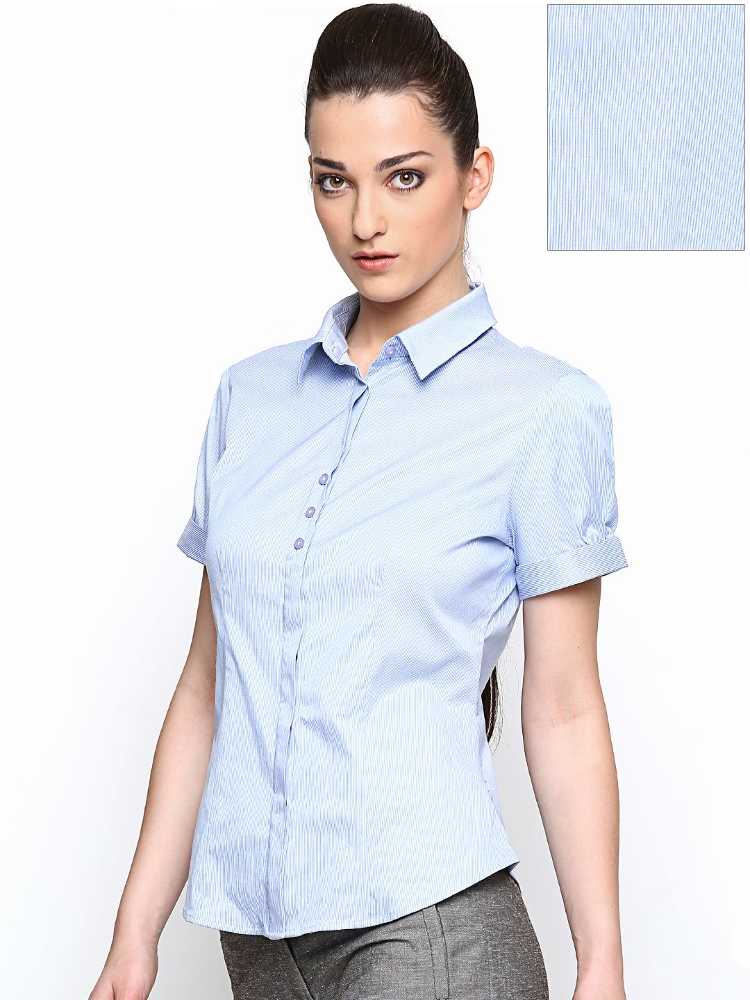

Product ID: 9141, Similarity Score: 0.1875, Gender Match: Same Gender


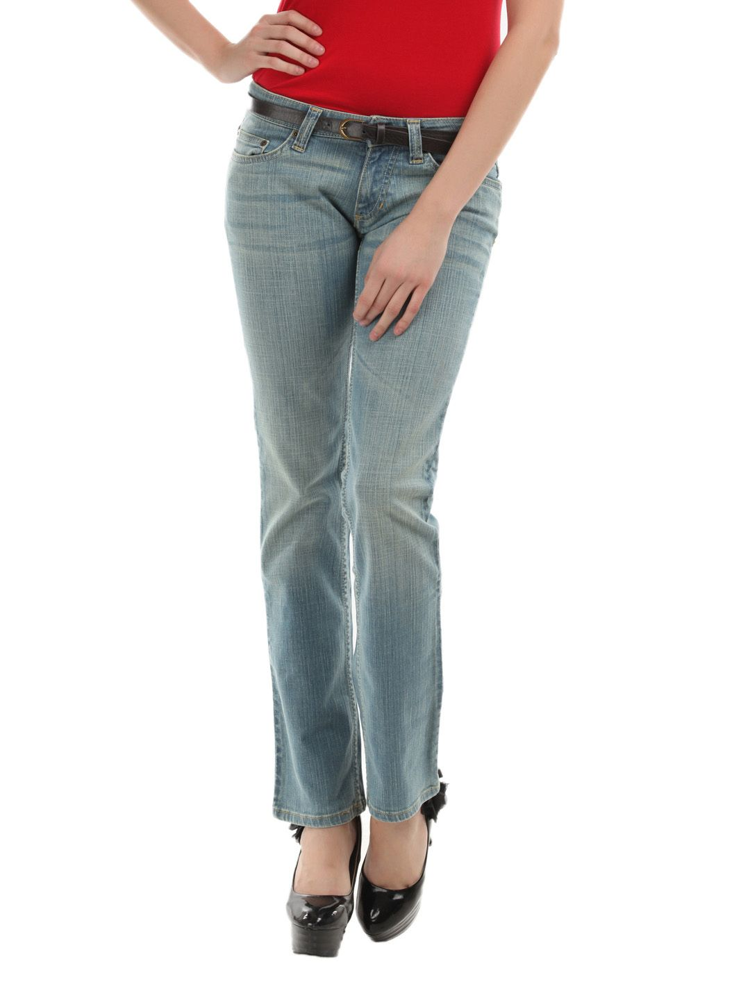

Product ID: 27430, Similarity Score: 0.5859, Gender Match: Same Gender


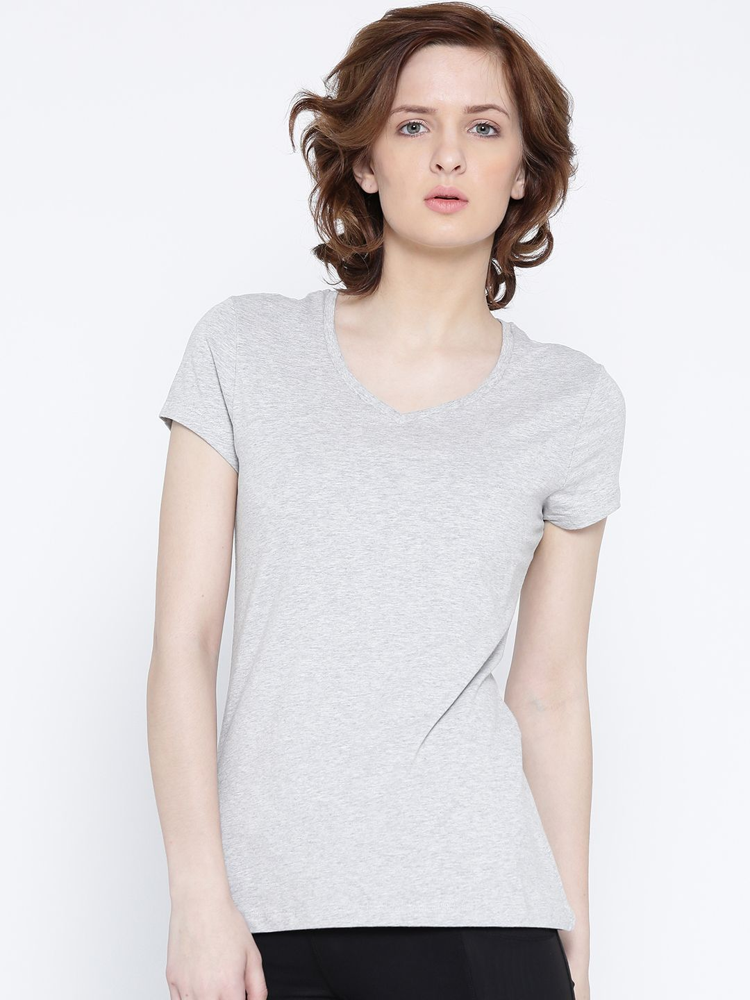

In [ ]:
item_id =10131 #watches-women
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder_path)

Product ID: 13671, Similarity Score: 0.3372, Gender Match: Same Gender


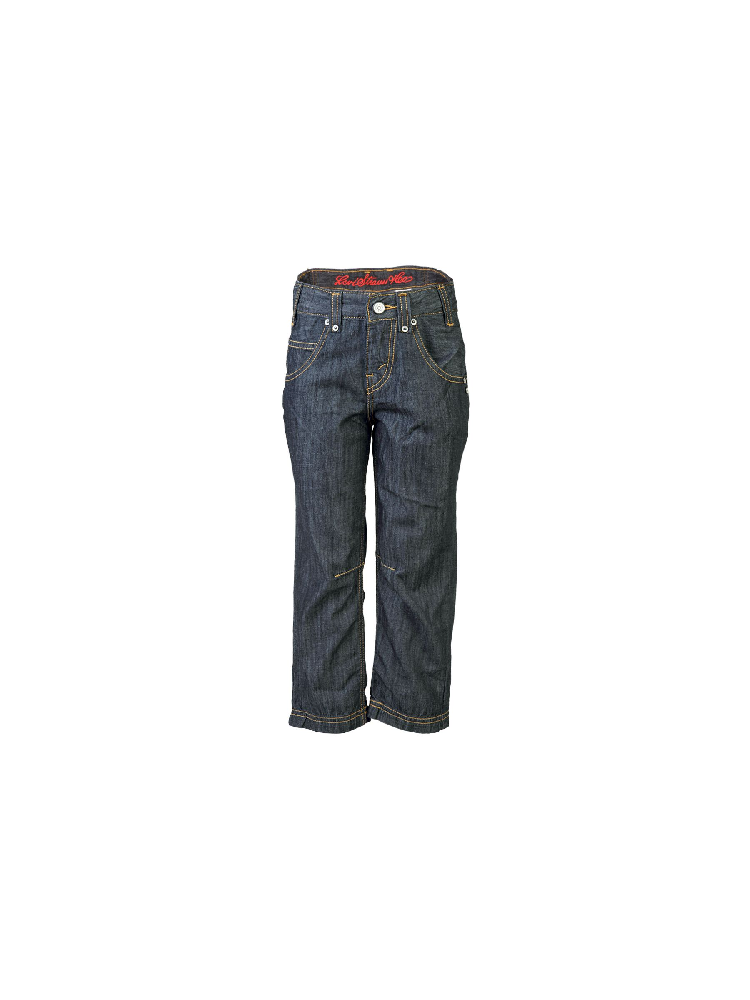

Product ID: 12838, Similarity Score: 0.6098, Gender Match: Same Gender


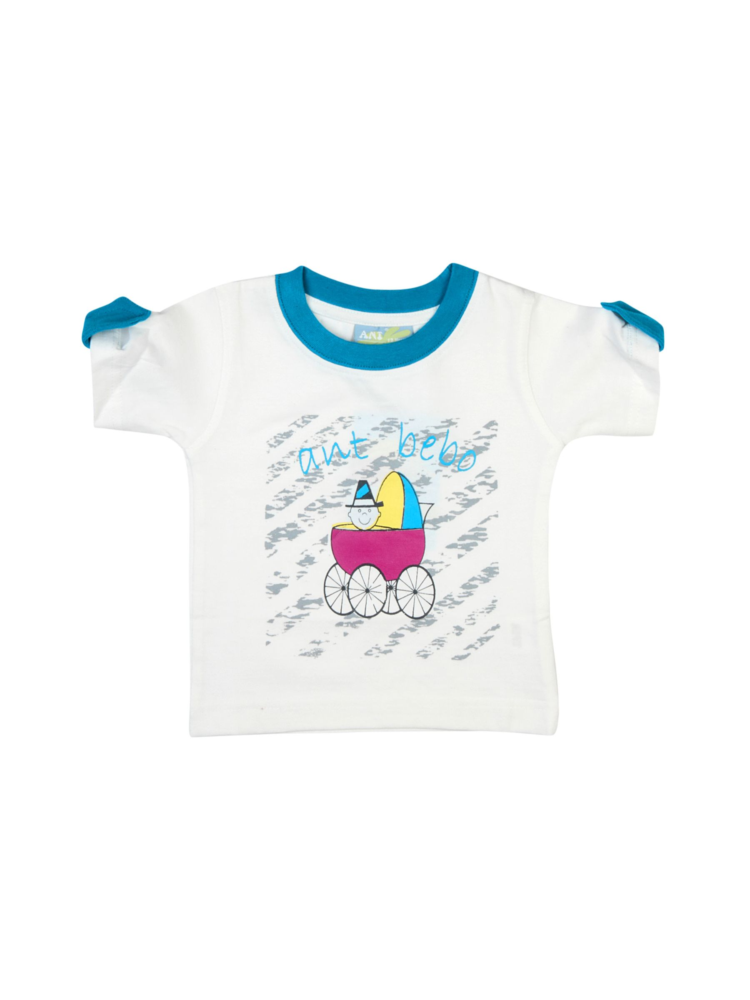

Product ID: 9017, Similarity Score: 0.2258, Gender Match: Same Gender


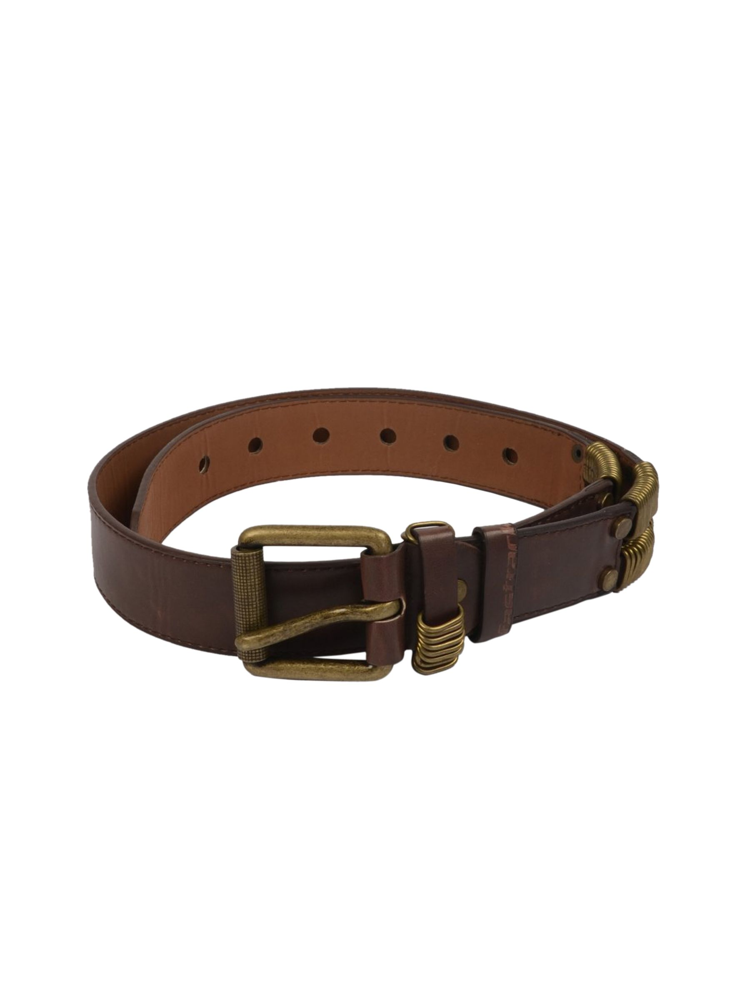

Product ID: 19411, Similarity Score: 0.7161, Gender Match: Same Gender


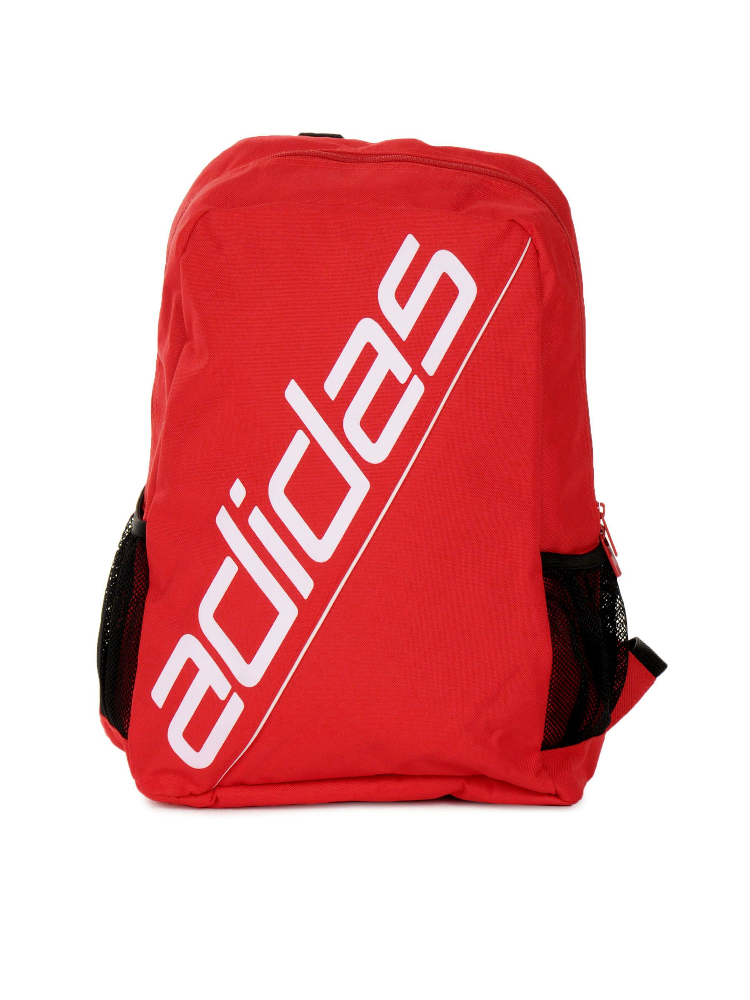

In [ ]:
item_id =5877 #unisex-casual shoes
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder_path)

Product ID: 43305, Similarity Score: 0.4140, Gender Match: Same Gender


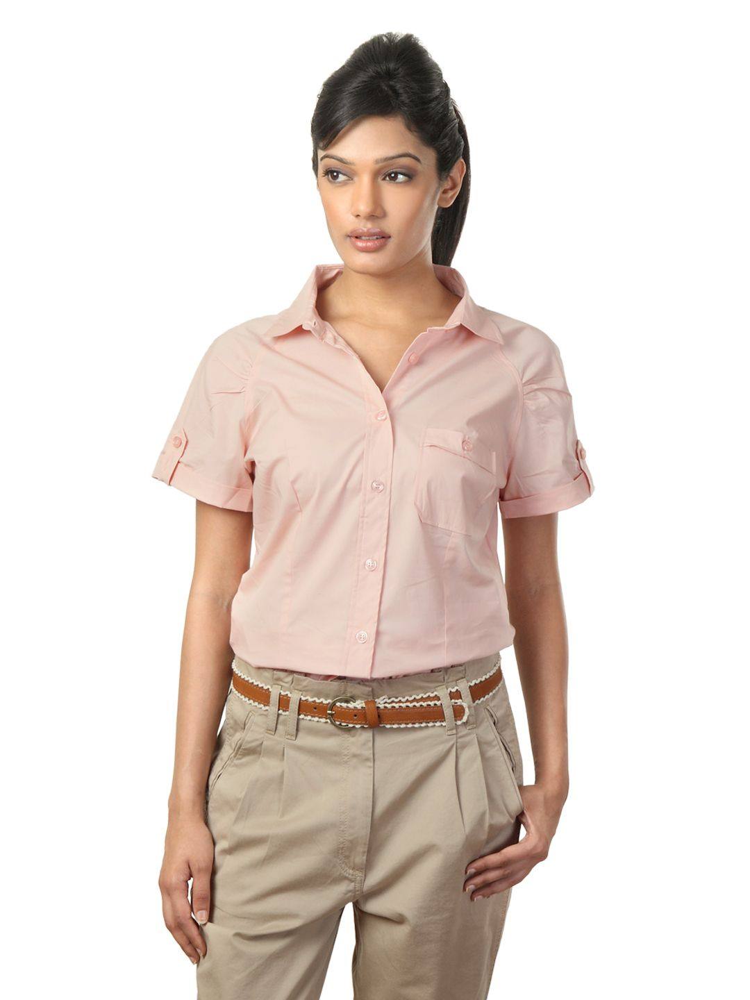

Product ID: 26991, Similarity Score: 0.3177, Gender Match: Same Gender


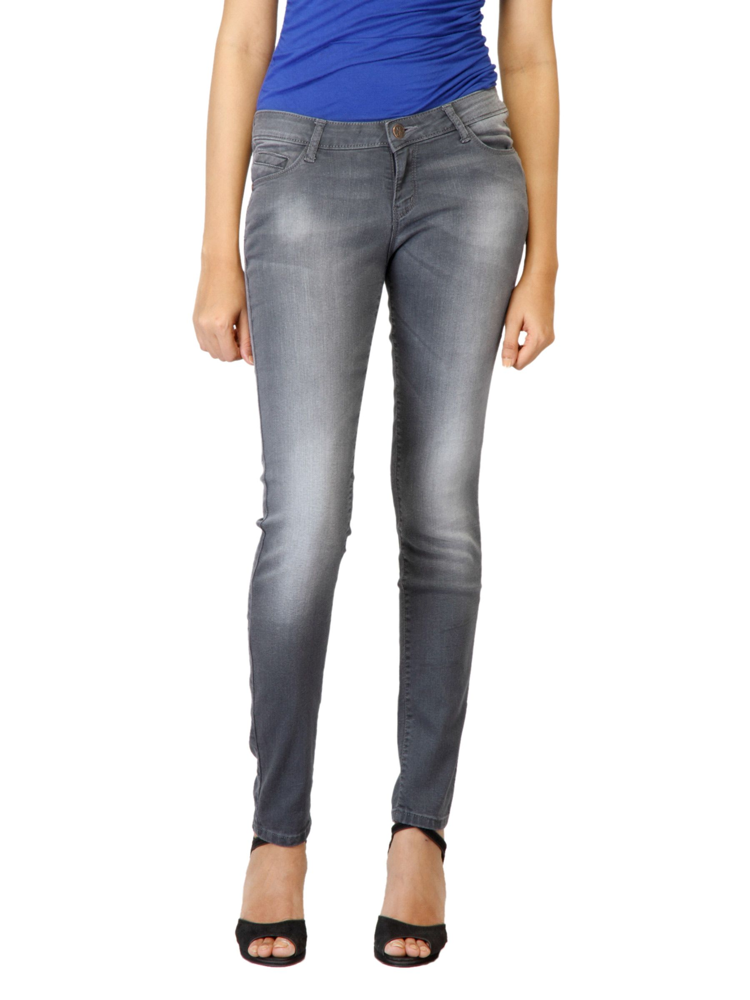

Product ID: 33111, Similarity Score: 0.5884, Gender Match: Same Gender


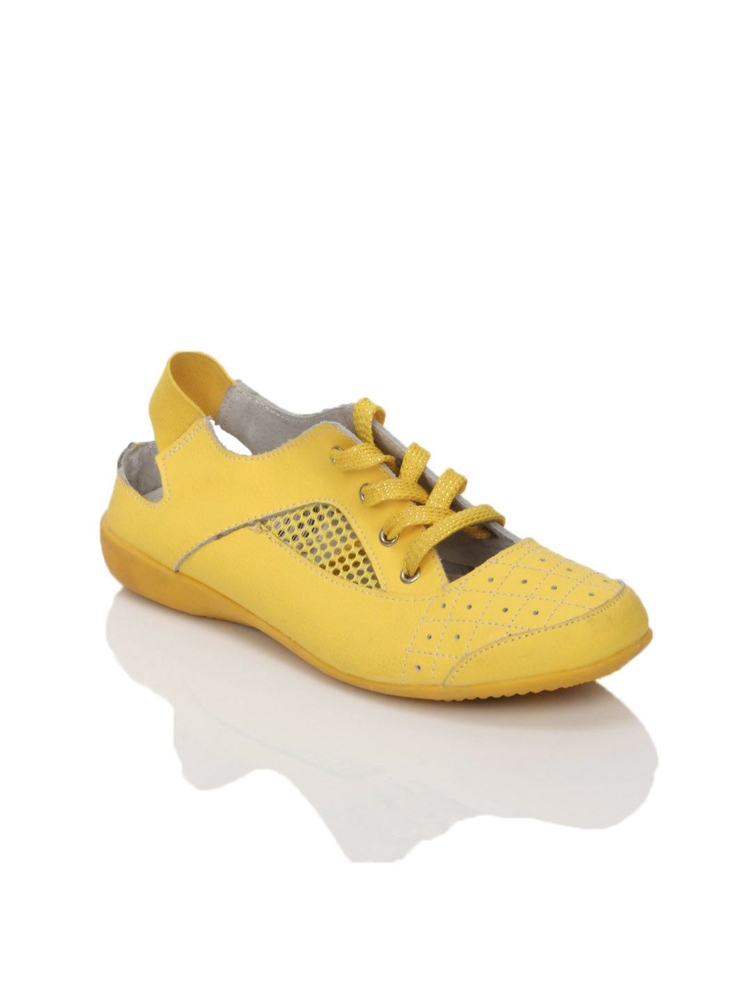

Product ID: 25102, Similarity Score: 0.5897, Gender Match: Same Gender


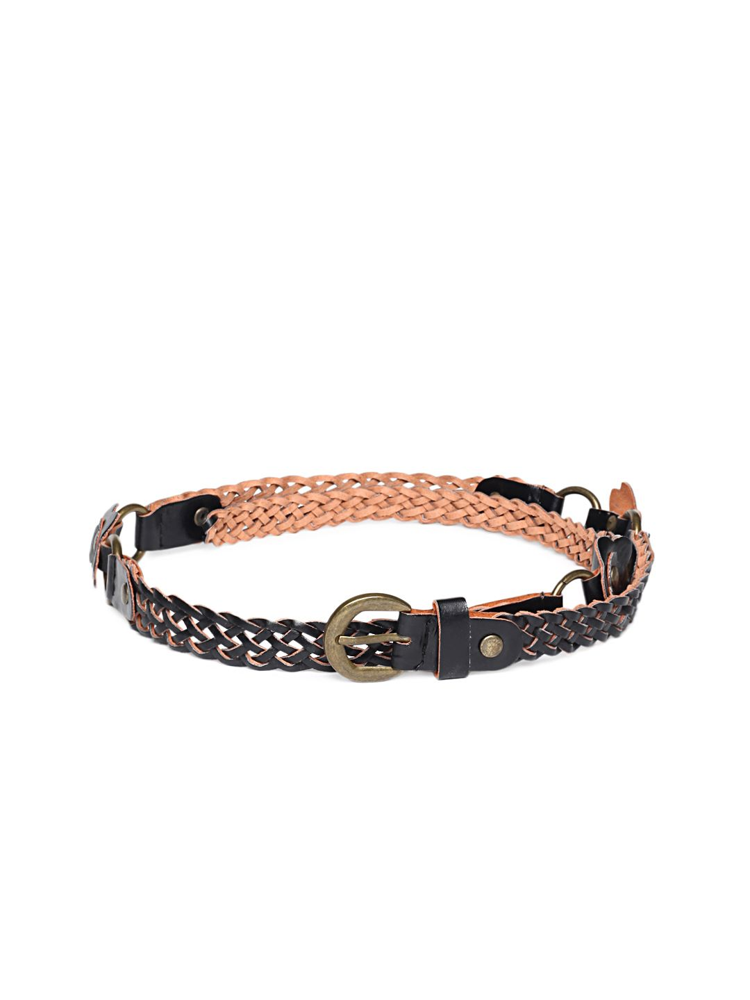

Product ID: 43331, Similarity Score: 0.2318, Gender Match: Same Gender


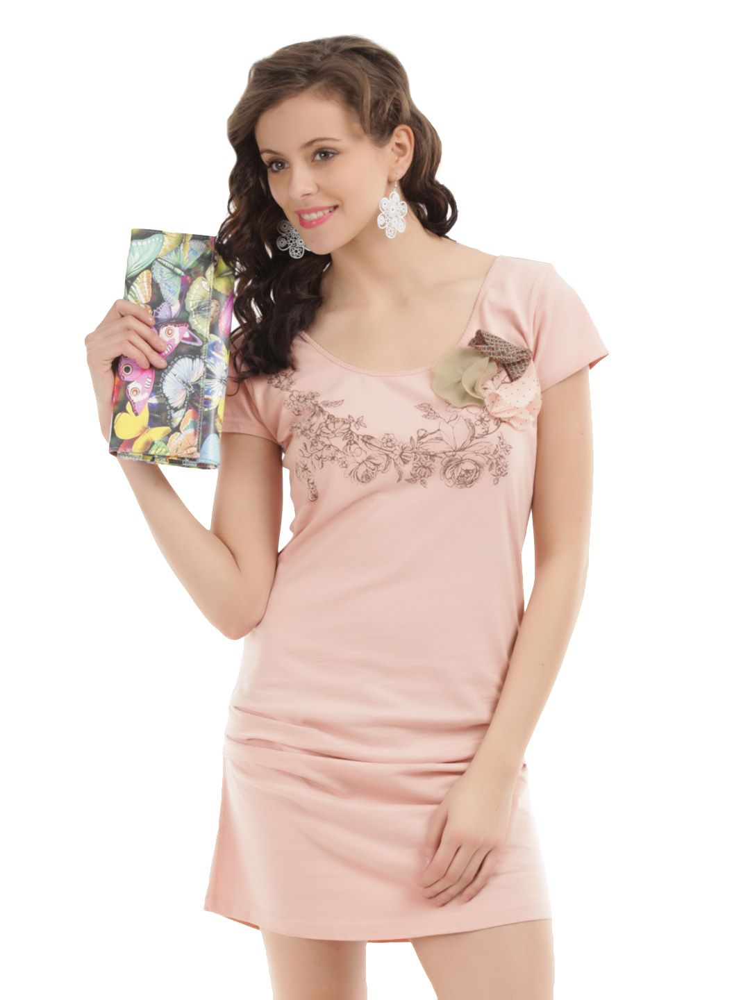

Product ID: 46040, Similarity Score: 0.8335, Gender Match: Same Gender


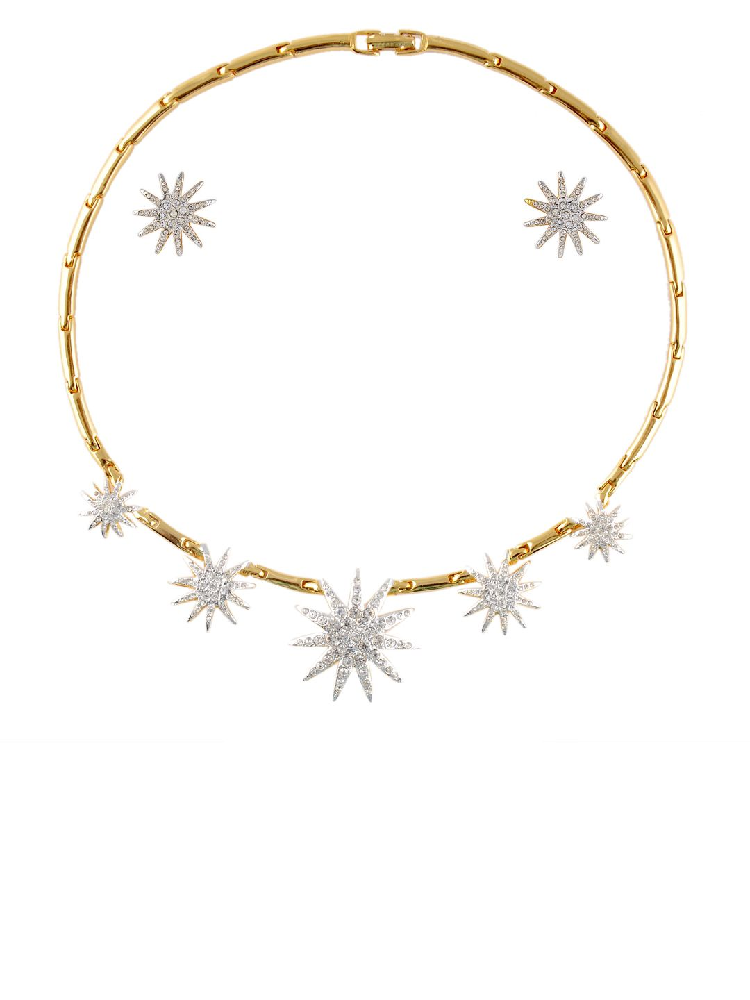

Product ID: 46049, Similarity Score: 0.8500, Gender Match: Same Gender


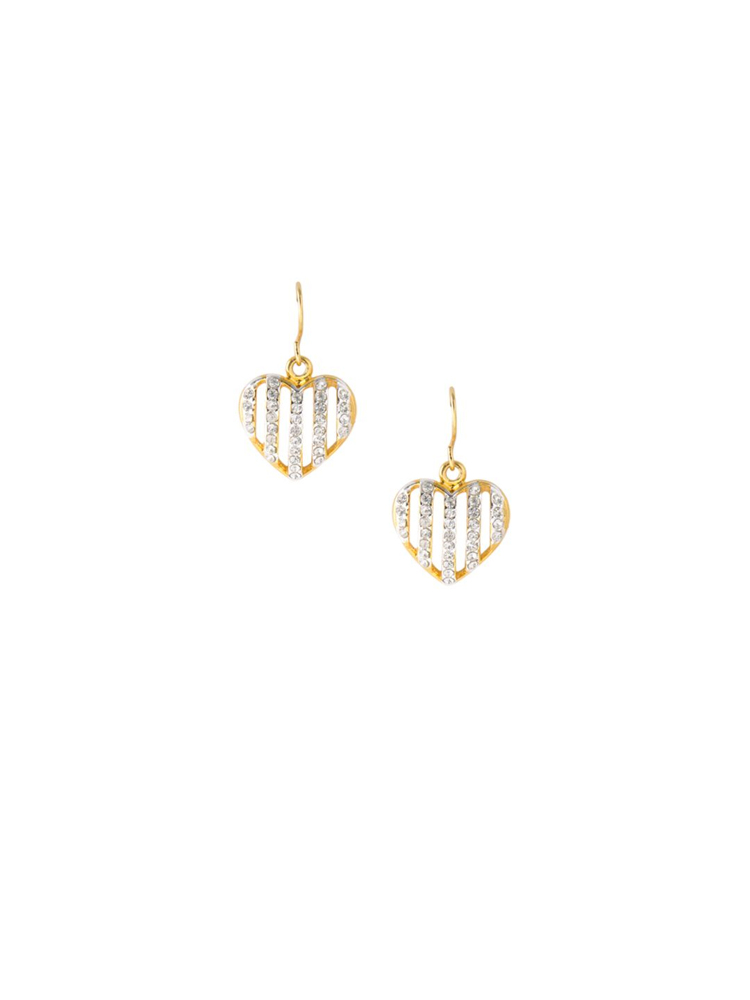

Product ID: 49874, Similarity Score: 0.7293, Gender Match: Same Gender


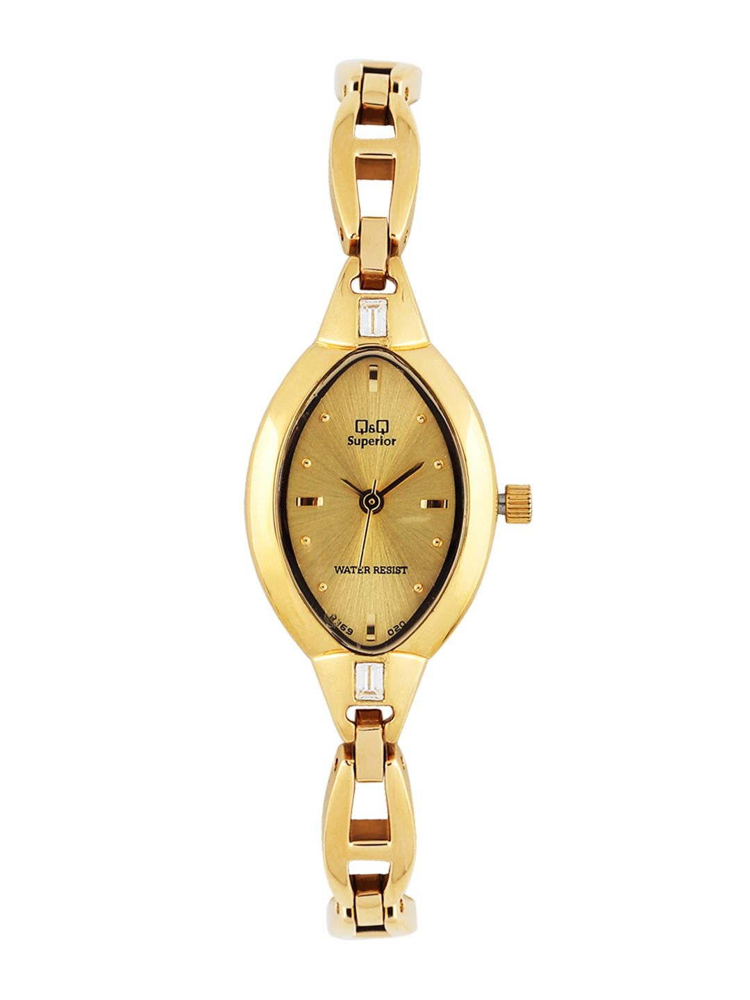

In [ ]:
item_id =59776 # bracelet for women
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder_path)

Product ID: 4806, Similarity Score: 0.2883, Gender Match: Same Gender


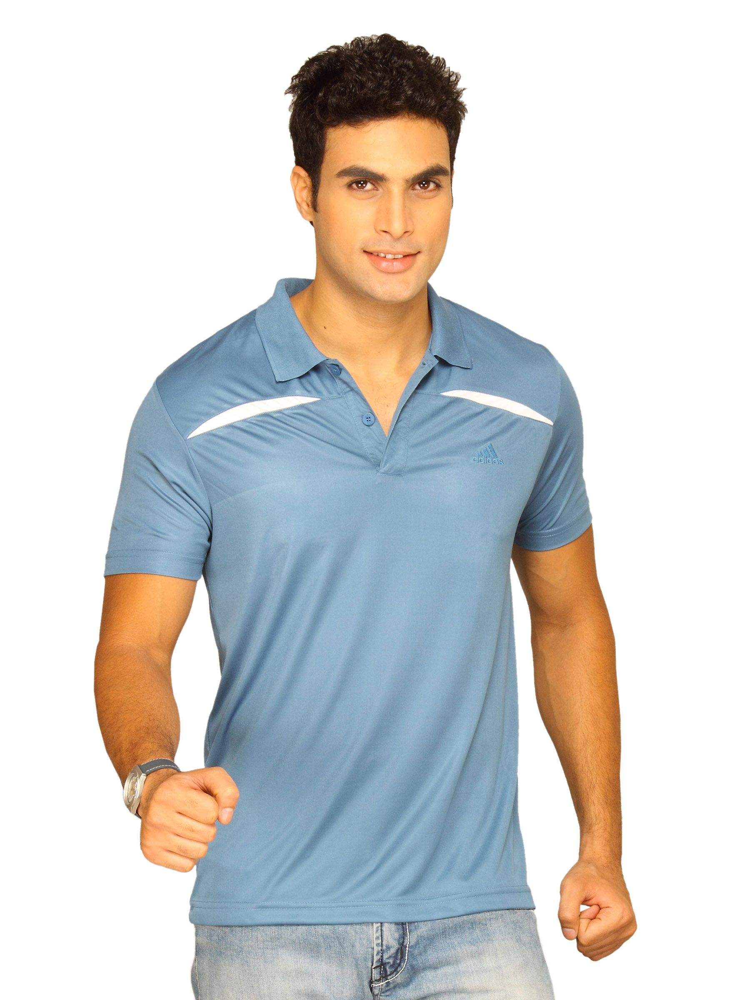

Product ID: 12044, Similarity Score: 0.1666, Gender Match: Same Gender


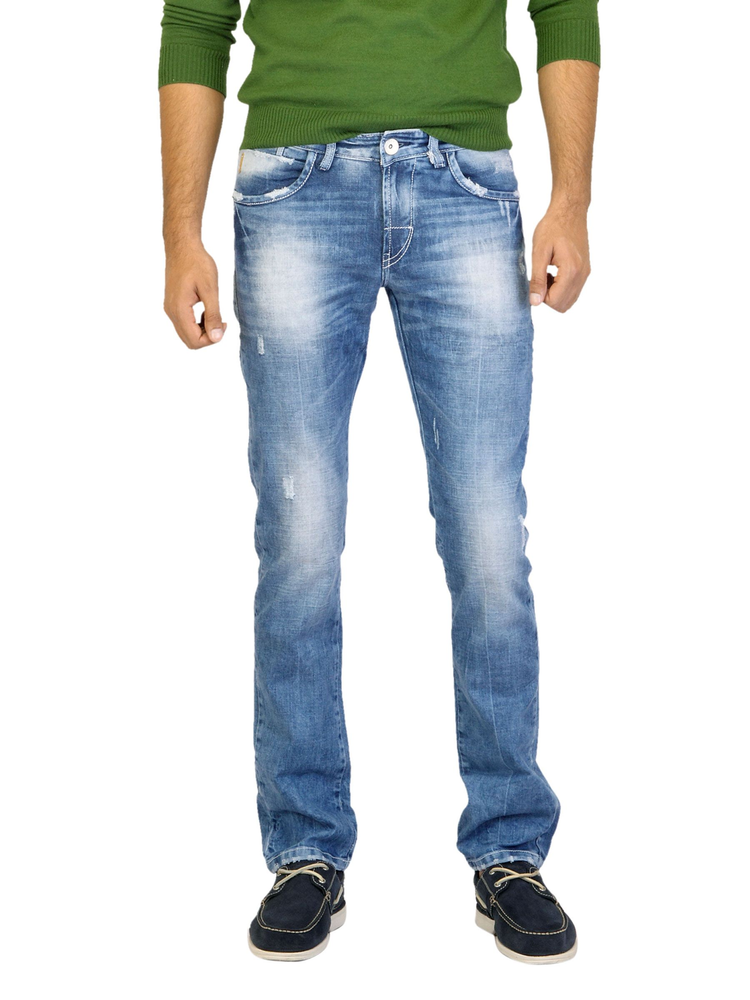

Product ID: 45887, Similarity Score: 0.3152, Gender Match: Same Gender


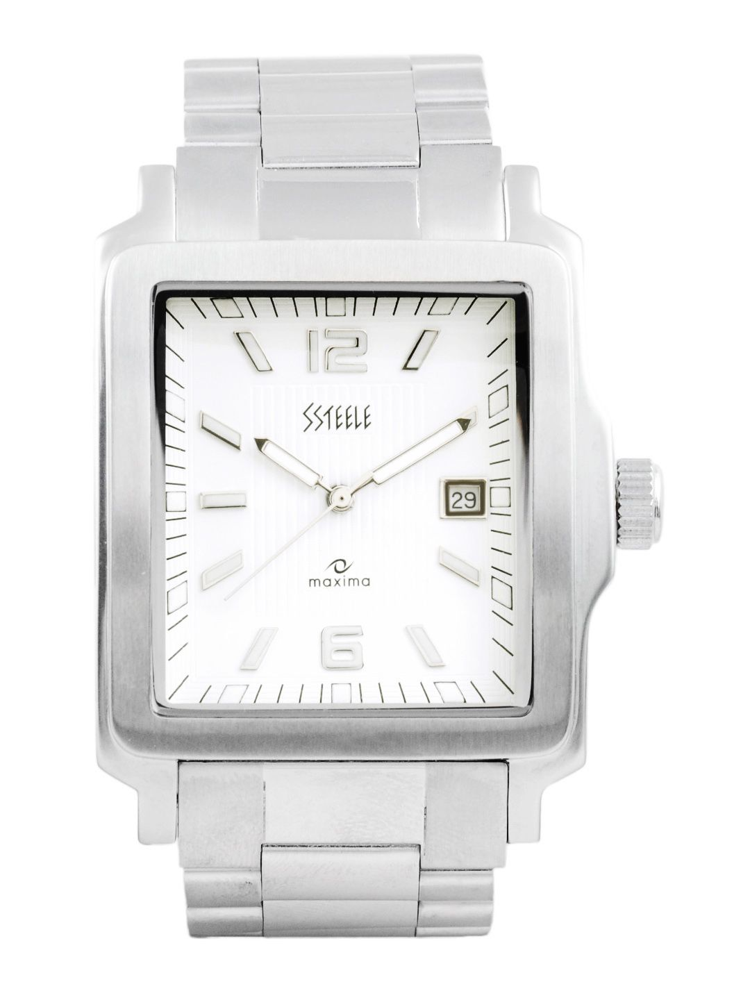

In [ ]:
#PENDANT-MEN
item_id =48808
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder_path)

Product ID: 50666, Similarity Score: 0.7050, Gender Match: Same Gender


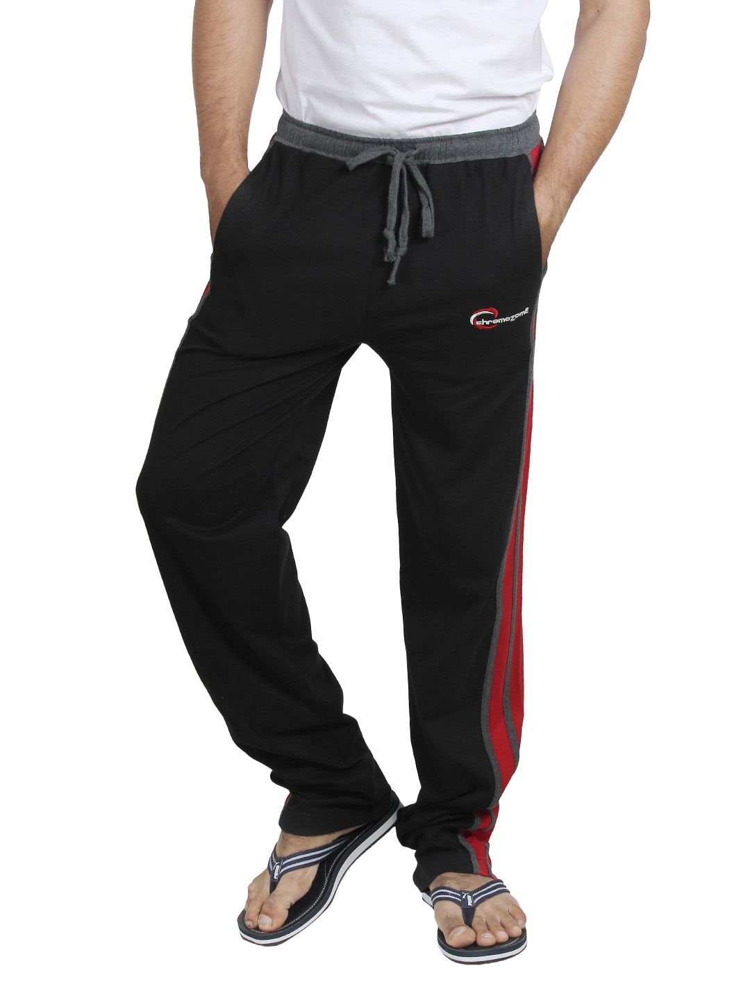

Product ID: 41525, Similarity Score: 0.6776, Gender Match: Same Gender


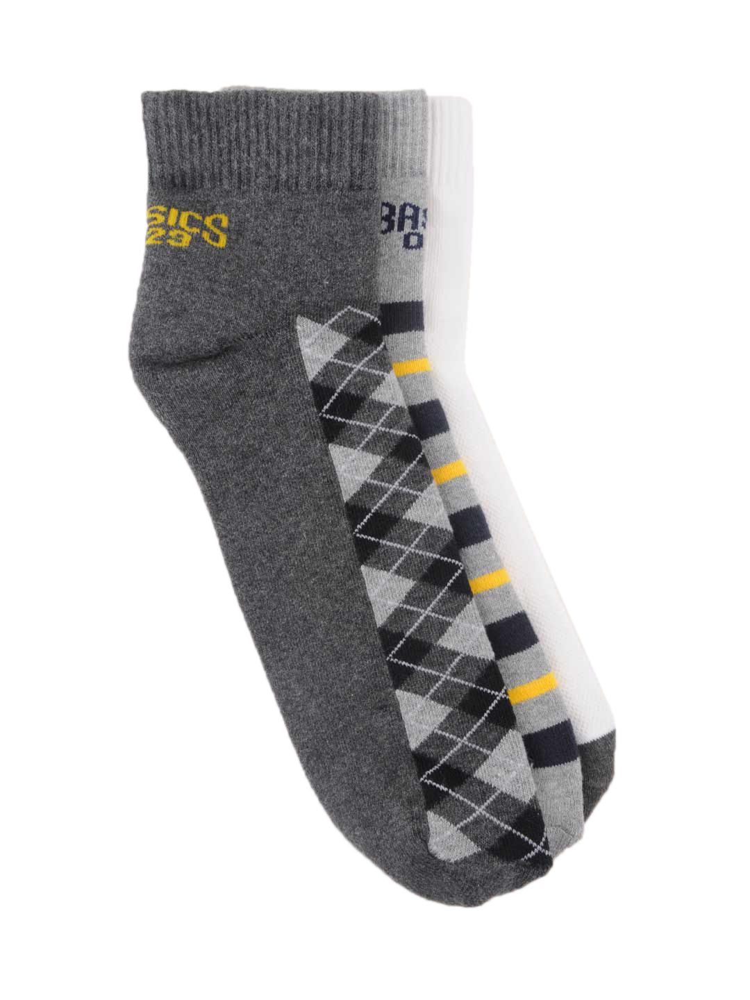

In [ ]:
#NIGHT SUITS
item_id =56235 #36276
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder_path)

Product ID: 28818, Similarity Score: 0.1387, Gender Match: Same Gender


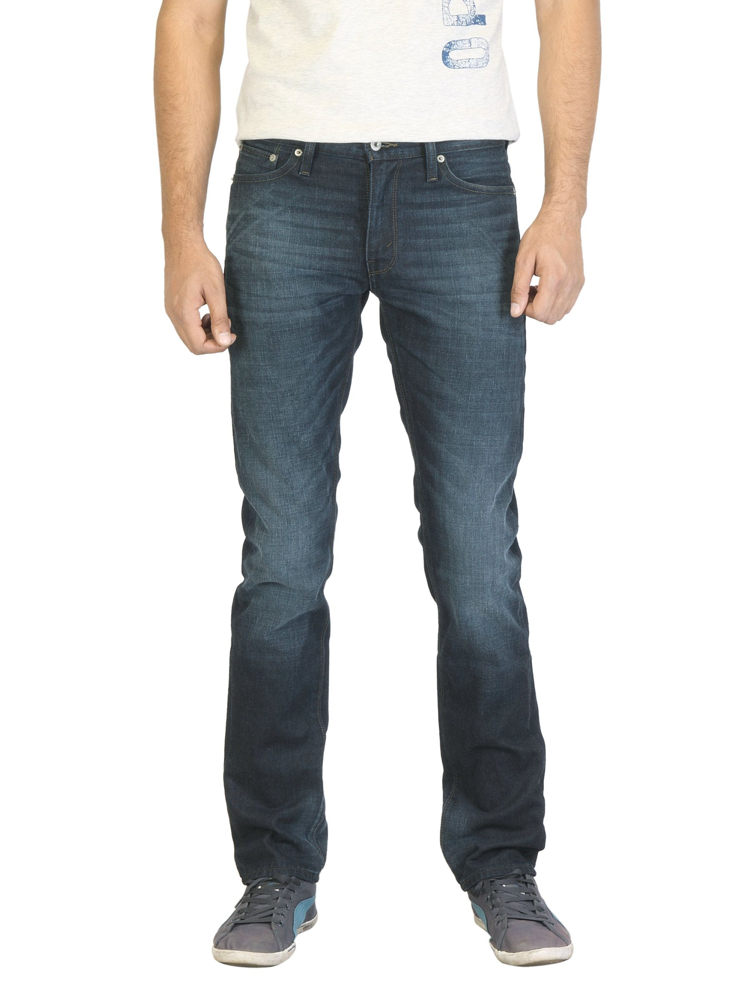

Product ID: 30806, Similarity Score: 0.6465, Gender Match: Same Gender


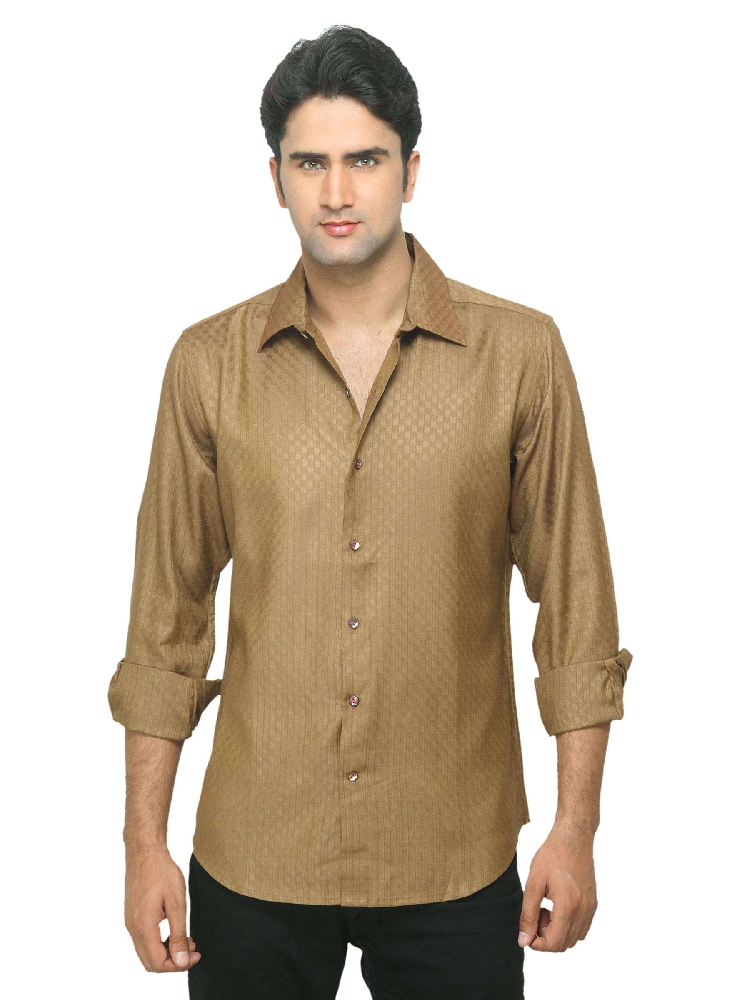

Product ID: 24501, Similarity Score: 0.4702, Gender Match: Same Gender


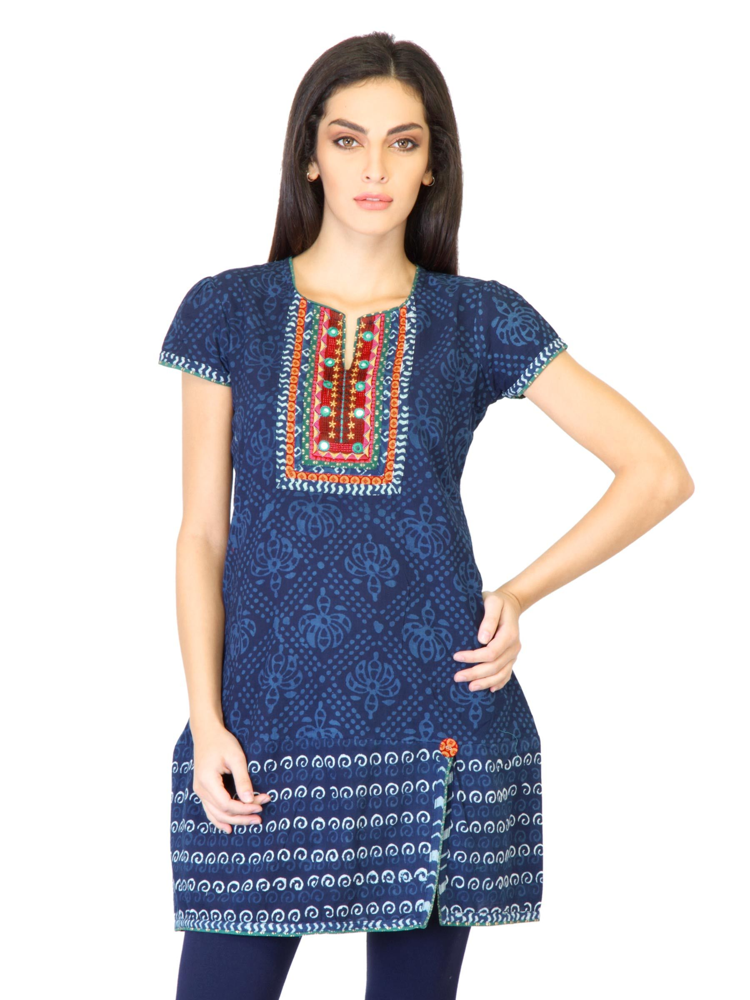

Product ID: 29752, Similarity Score: 0.4961, Gender Match: Same Gender


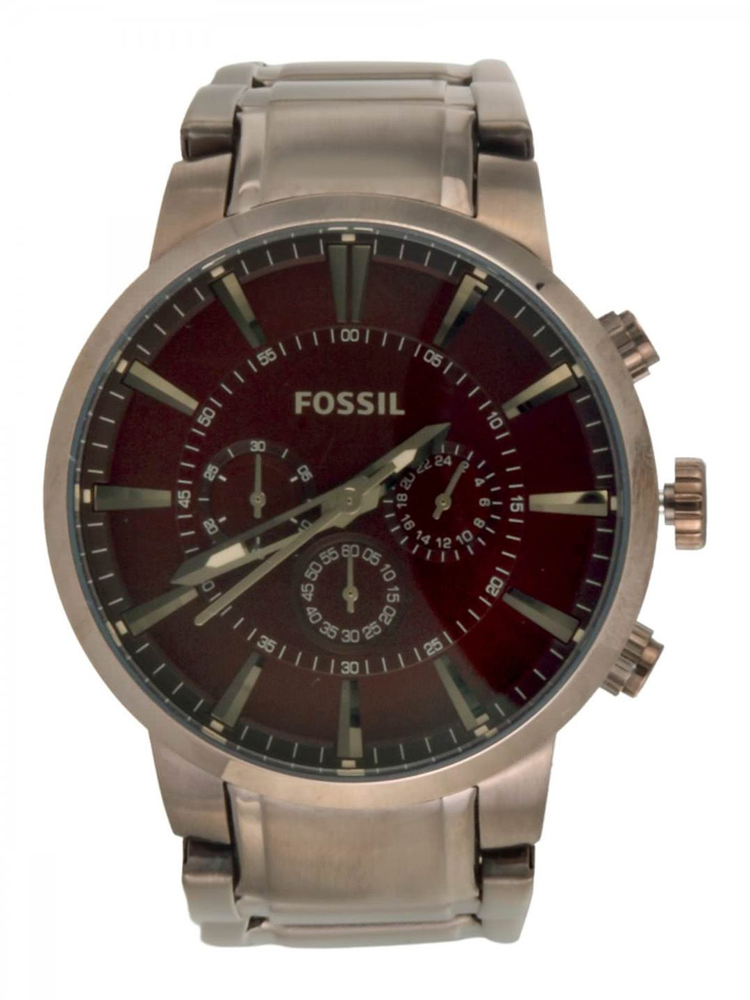

In [ ]:
#WALLETS-MEN
item_id =39557 #7615
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder_path)

Product ID: 34898, Similarity Score: 0.5867, Gender Match: Same Gender


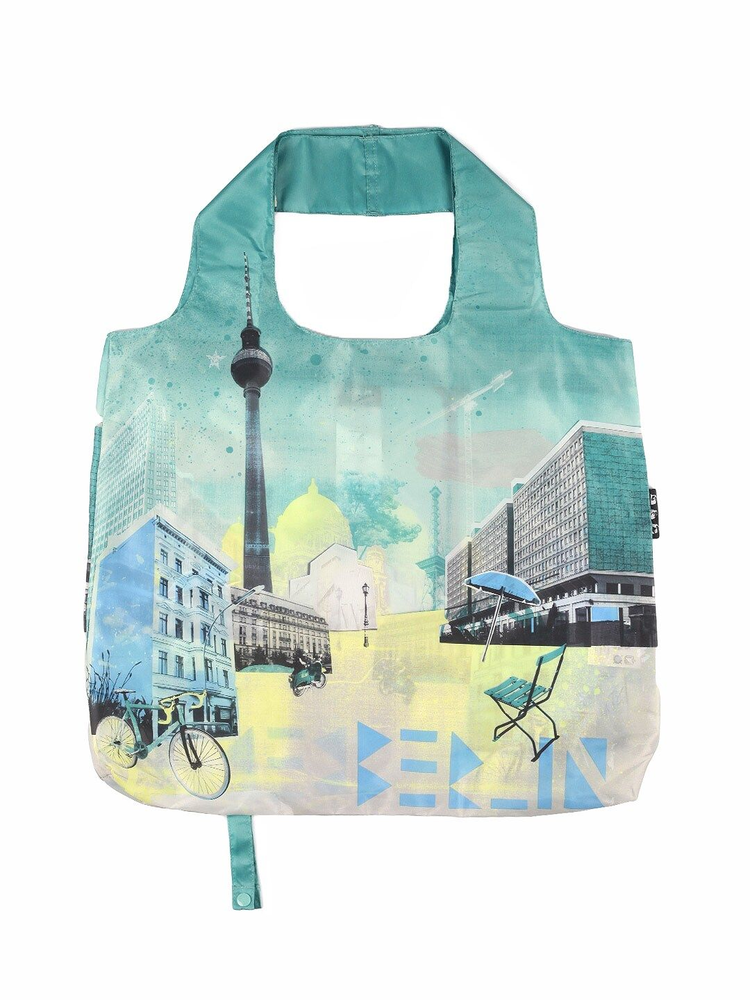

Product ID: 58076, Similarity Score: 0.5912, Gender Match: Same Gender


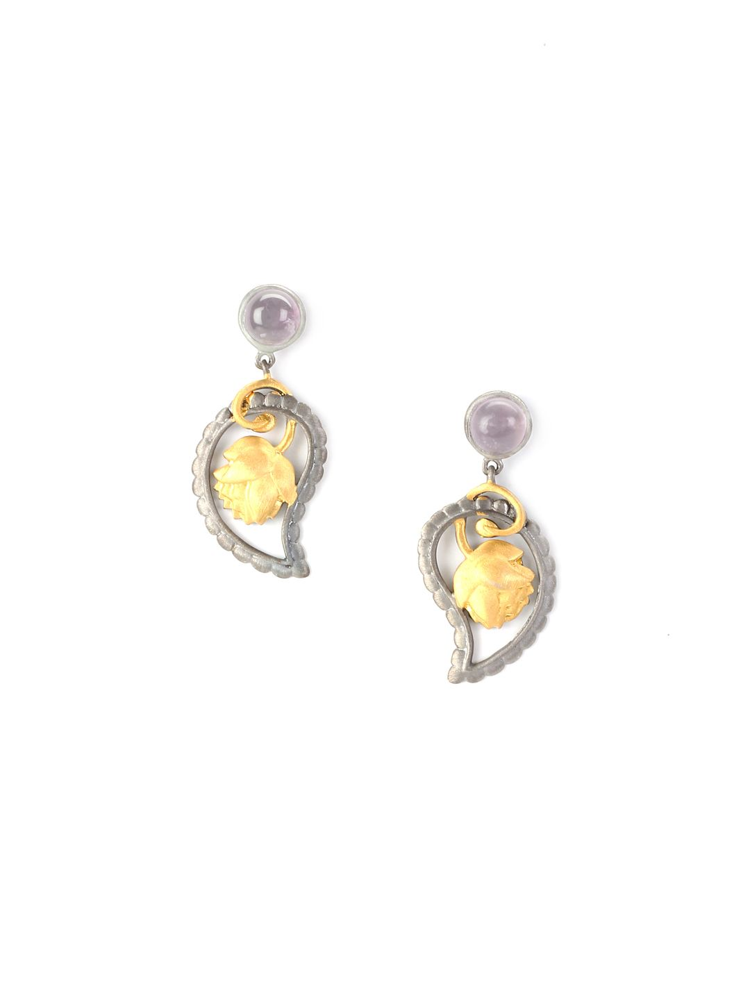

Product ID: 54162, Similarity Score: 0.5387, Gender Match: Same Gender


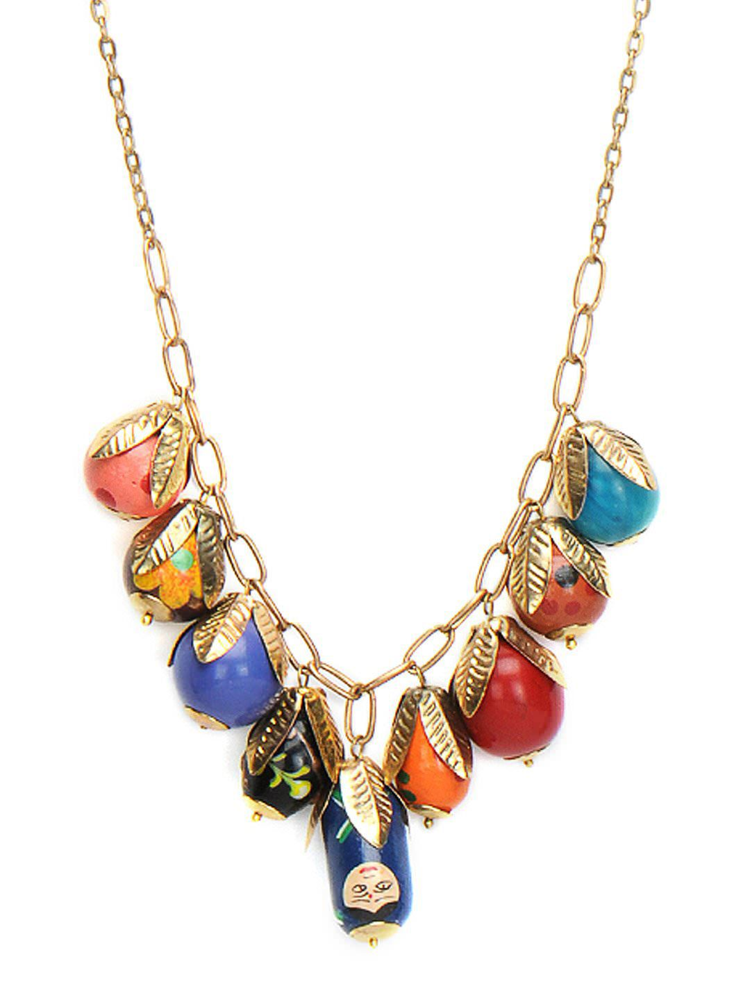

Product ID: 56926, Similarity Score: 0.5868, Gender Match: Same Gender


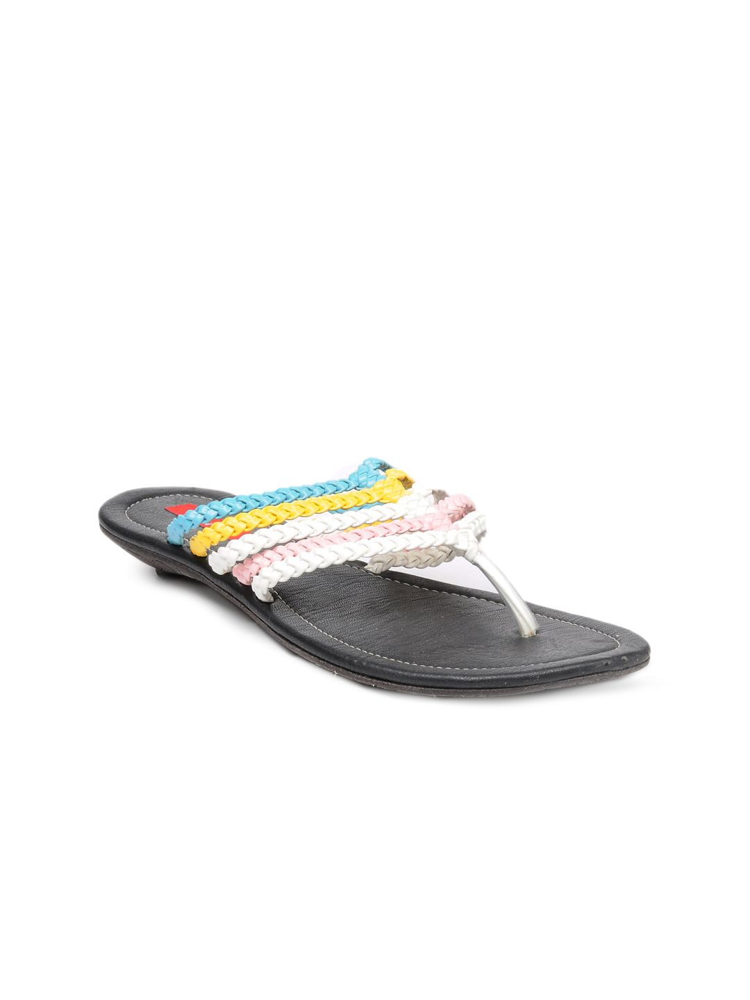

In [ ]:
#Saree
item_id =53044 #39557 #7615
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder)

In [ ]:
df['articleType'].unique()

array(['Skirts', 'Kurtas', 'Handbags', 'Tshirts', 'Watches',
       'Formal Shoes', 'Flip Flops', 'Heels', 'Leggings', 'Backpacks',
       'Earrings', 'Clutches', 'Shirts', 'Casual Shoes', 'Dupatta',
       'Jeans', 'Tops', 'Ring', 'Flats', 'Suspenders', 'Sports Shoes',
       'Sunglasses', 'Shorts', 'Belts', 'Sarees', 'Nightdress', 'Jackets',
       'Trousers', 'Messenger Bag', 'Track Pants', 'Kurtis', 'Capris',
       'Nehru Jackets', 'Sweatshirts', 'Wallets', 'Socks',
       'Necklace and Chains', 'Stockings', 'Waist Pouch', 'Patiala',
       'Tunics', 'Booties', 'Lounge Pants', 'Sweaters', 'Pendant',
       'Duffel Bag', 'Tracksuits', 'Baby Dolls', 'Bath Robe',
       'Laptop Bag', 'Night suits', 'Tights', 'Jeggings', 'Mobile Pouch',
       'Jewellery Set', 'Lounge Shorts', 'Swimwear', 'Bangle', 'Churidar',
       'Salwar', 'Shrug', 'Bracelet', 'Waistcoat', 'Rucksacks', 'Blazers',
       'Rompers', 'Robe', 'Salwar and Dupatta', 'Tablet Sleeve',
       'Dresses', 'Rain Jacket', 'Lou

In [ ]:

def get_diverse_complementary_recommendations(item_id, df, final_features, image_folder_path):
    try:
        item_idx = df.index[df['id'] == item_id][0]
    except IndexError:
        print("Item ID not found in dataset.")
        return []

    item_article_type = df.loc[item_idx, 'articleType']
    item_gender = df.loc[item_idx, 'gender']
    item_master_category = df.loc[item_idx, 'masterCategory']
    item_color = df.loc[item_idx, 'baseColour']
    complementary_article_types = complementary_mapping.get(item_article_type, [])

    if not complementary_article_types:
        print("No complementary mapping found for the given item.")
        return []

    # Get contrasting colors for the input item
    contrasting_colors = color_contrast_map.get(item_color, [])

    # Filter for items in the complementary article types and same gender, with different master category
    diverse_recommendations = []
    recommended_ids = set()  # To track already recommended item IDs

    for article_type in complementary_article_types:
        type_specific_items = df[(df['articleType'] == article_type) &
                                 (df['gender'] == item_gender) &
                                 (df['masterCategory'] != item_master_category)]

        # If no items found, search for same gender in other rows
        if type_specific_items.empty:
            type_specific_items = df[(df['articleType'] == article_type) &
                                     (df['gender'] == item_gender)]

        # Further filter by contrasting colors
        type_specific_items = type_specific_items[type_specific_items['baseColour'].isin(contrasting_colors)]

        if not type_specific_items.empty:
            complementary_features = final_features[type_specific_items.index]
            item_feature_vector = final_features[item_idx].reshape(1, -1)
            similarities = cosine_similarity(item_feature_vector, complementary_features).flatten()

            type_specific_items = type_specific_items.copy()
            type_specific_items['similarity'] = similarities

            # Sort by similarity and select the top item that hasn't been recommended yet
            for _, item in type_specific_items.sort_values(by='similarity', ascending=False).iterrows():
                if item['id'] not in recommended_ids:
                    diverse_recommendations.append(item)
                    recommended_ids.add(item['id'])
                    break  # Only take one item per articleType

    # Display recommendations
    for item in diverse_recommendations:
        item_id = item['id']
        filename = item['filename']
        similarity_score = item['similarity']

        image_path = f"{image_folder_path}/{filename}"
        gender_match = "Same Gender" if item['gender'] == item_gender else "Different Gender"
        print(f"Product ID: {item_id}, Similarity Score: {similarity_score:.4f}, Gender Match: {gender_match}")
        display(Image(filename=image_path, width=150, height=150))

    if not diverse_recommendations:
        print("No recommendations found.")

Product ID: 4098, Similarity Score: 0.5571, Gender Match: Same Gender


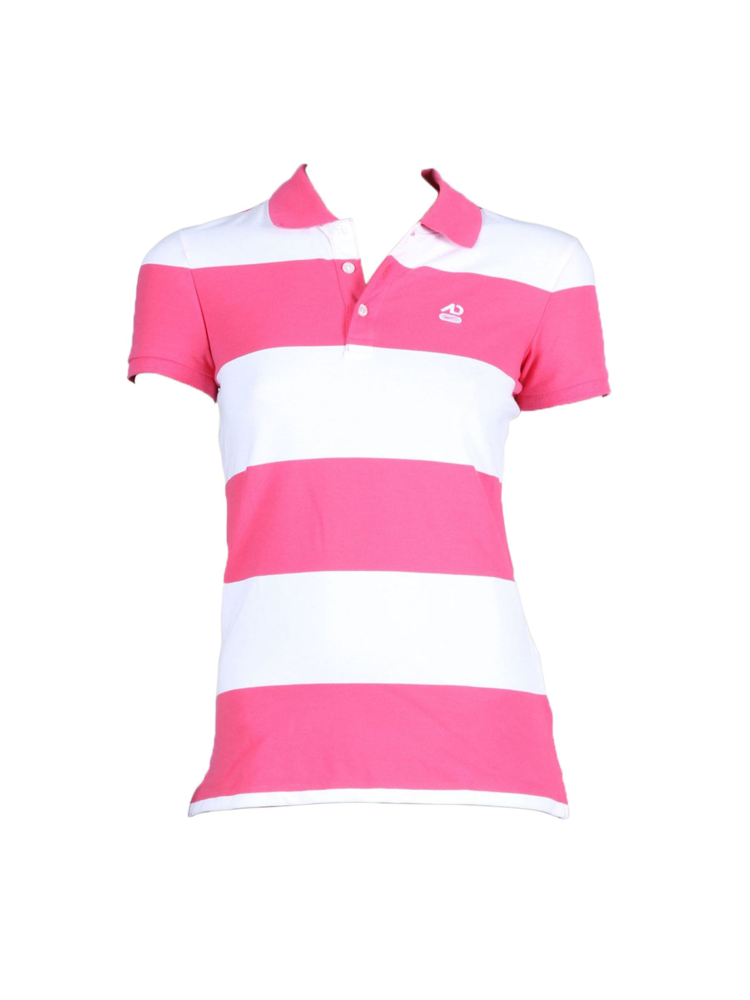

Product ID: 19292, Similarity Score: 0.3954, Gender Match: Same Gender


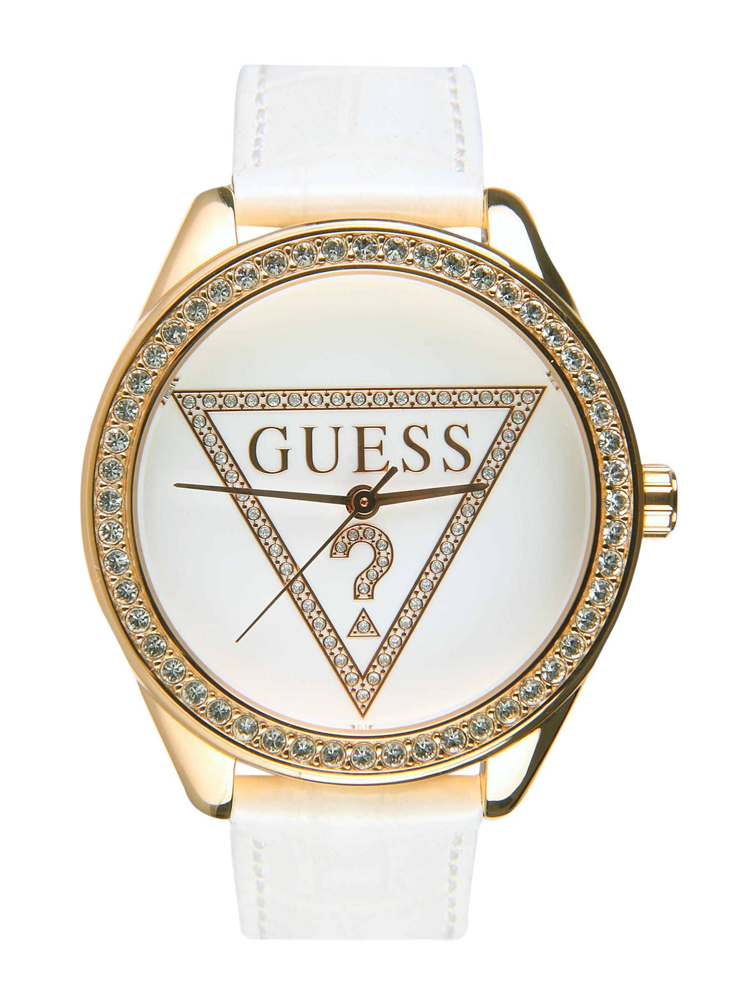

Product ID: 59428, Similarity Score: 0.5577, Gender Match: Same Gender


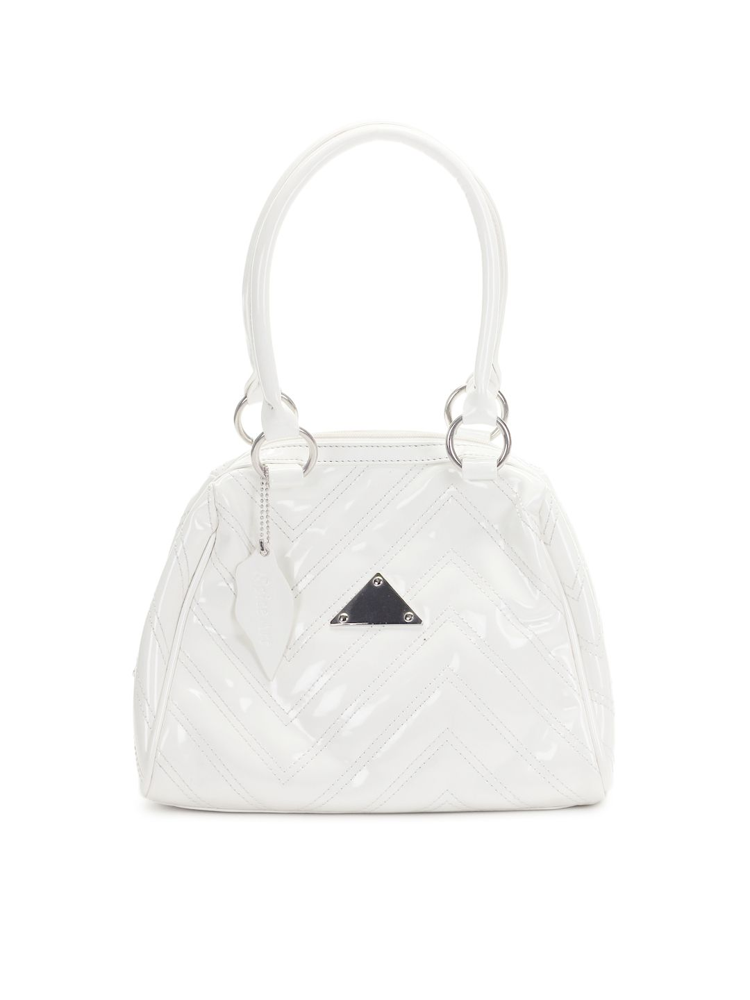

Product ID: 47625, Similarity Score: 0.5106, Gender Match: Same Gender


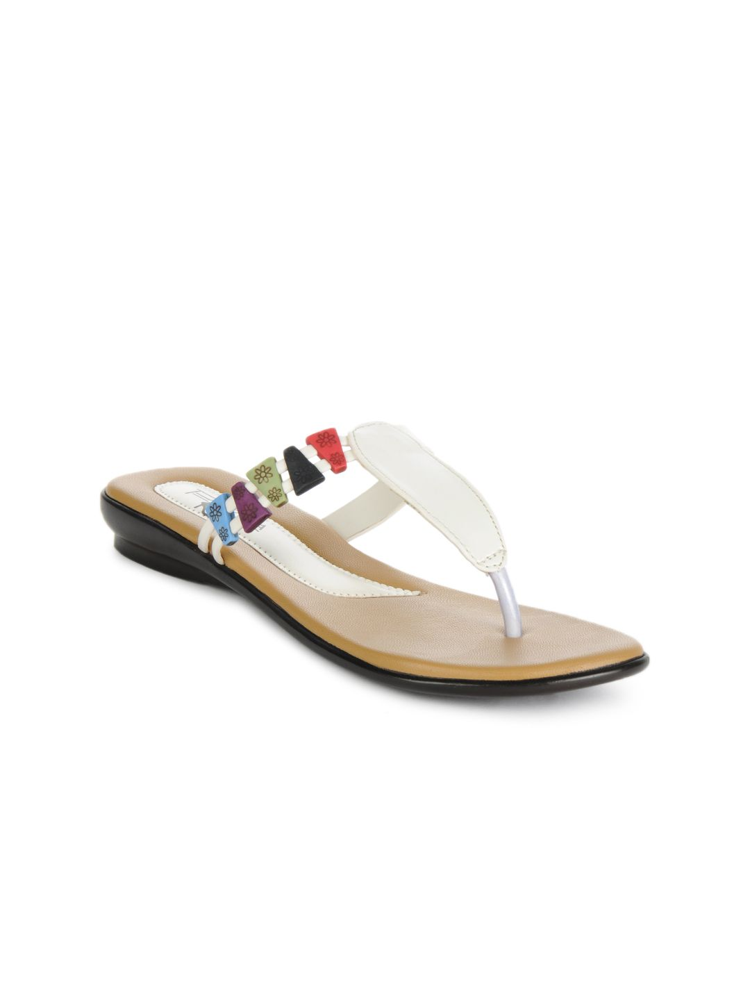

In [ ]:
item_id=8493
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder)

Product ID: 24730, Similarity Score: 0.4273, Gender Match: Same Gender


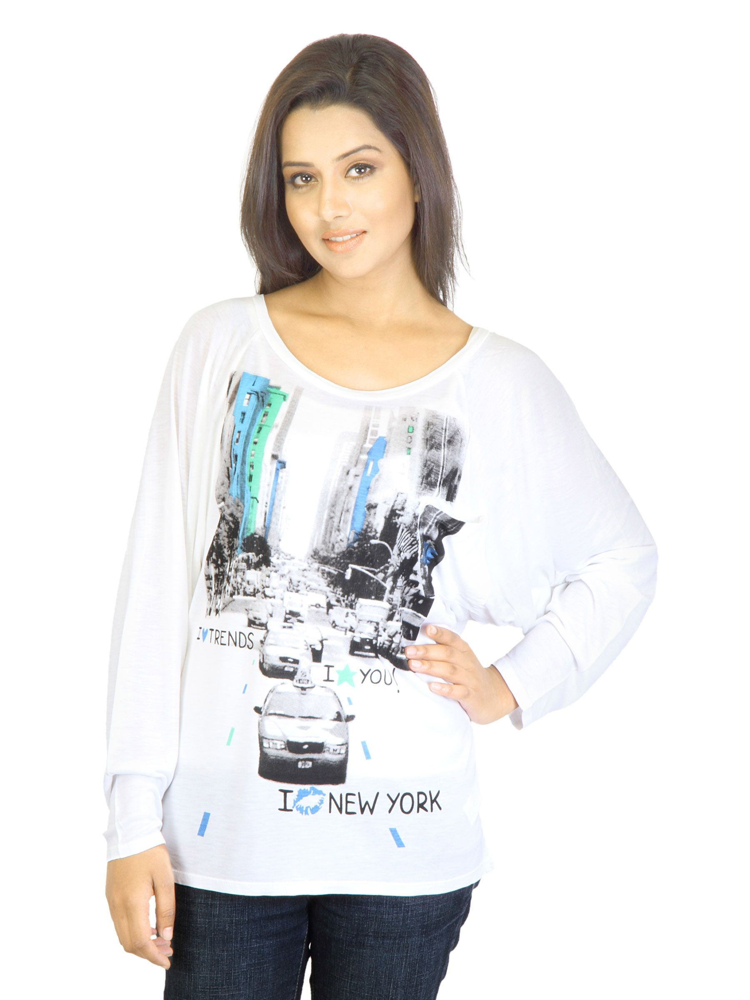

Product ID: 7191, Similarity Score: 0.3529, Gender Match: Same Gender


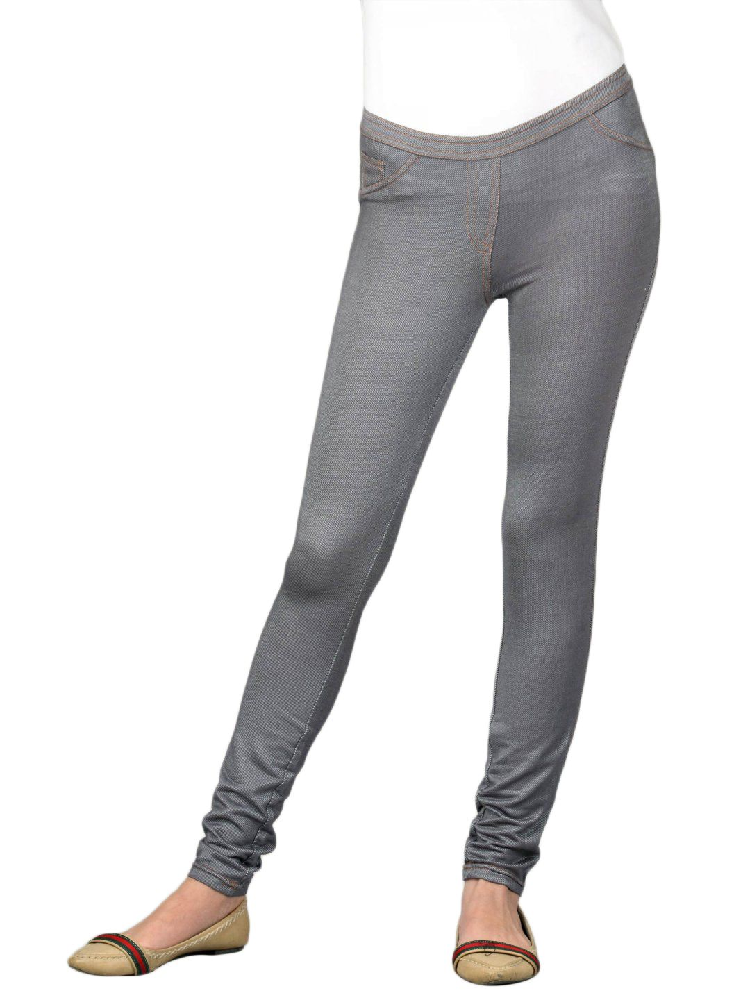

Product ID: 19292, Similarity Score: 0.2564, Gender Match: Same Gender


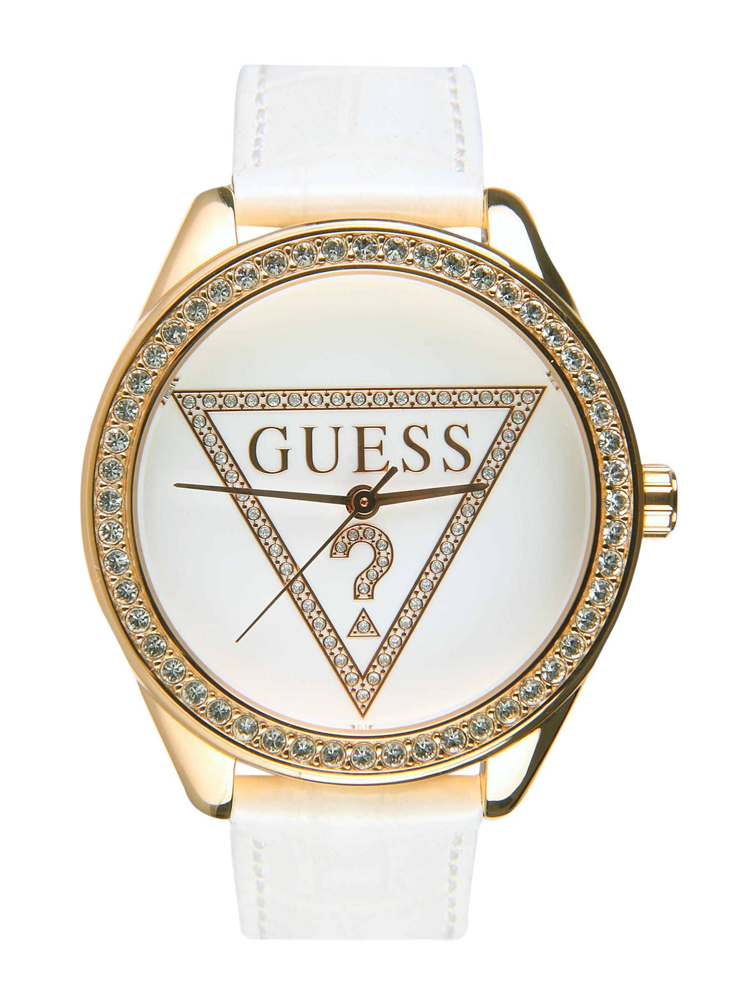

Product ID: 14441, Similarity Score: 0.3057, Gender Match: Same Gender


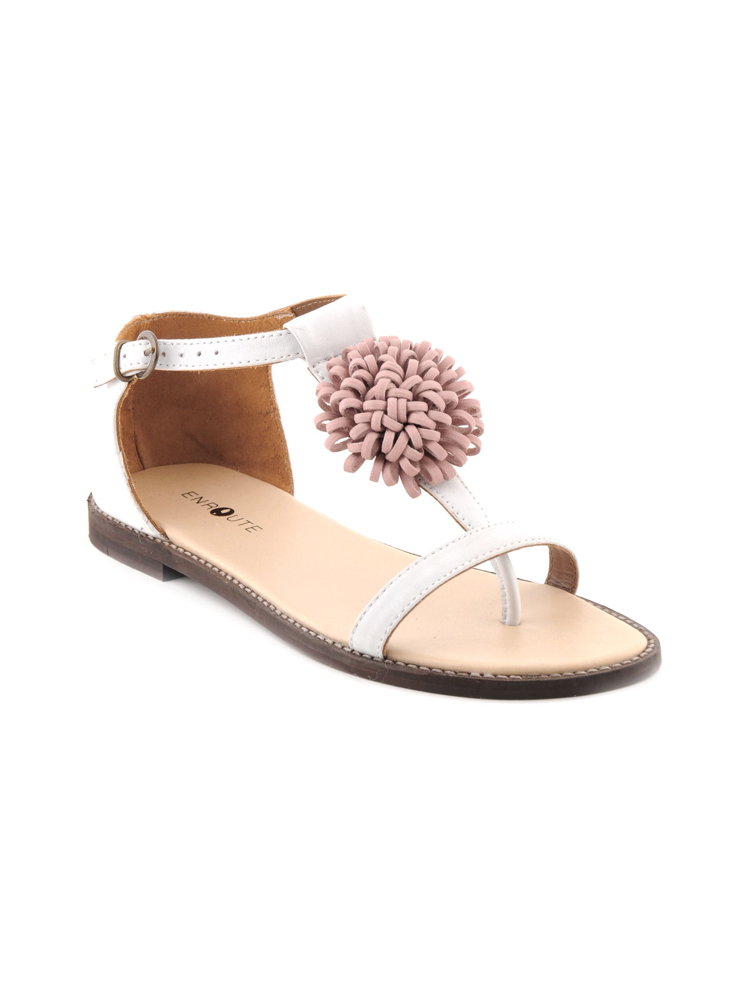

In [ ]:
item_id= 14881 #Hanbag
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder)

Product ID: 23771, Similarity Score: 0.5495, Gender Match: Same Gender


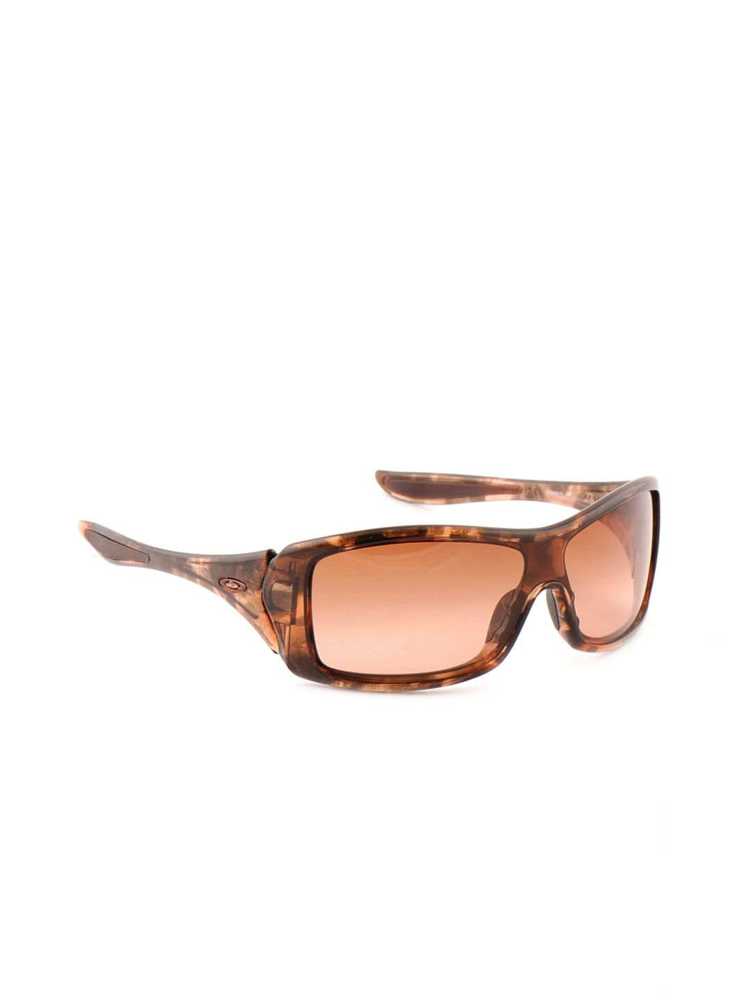

Product ID: 42969, Similarity Score: 0.7958, Gender Match: Same Gender


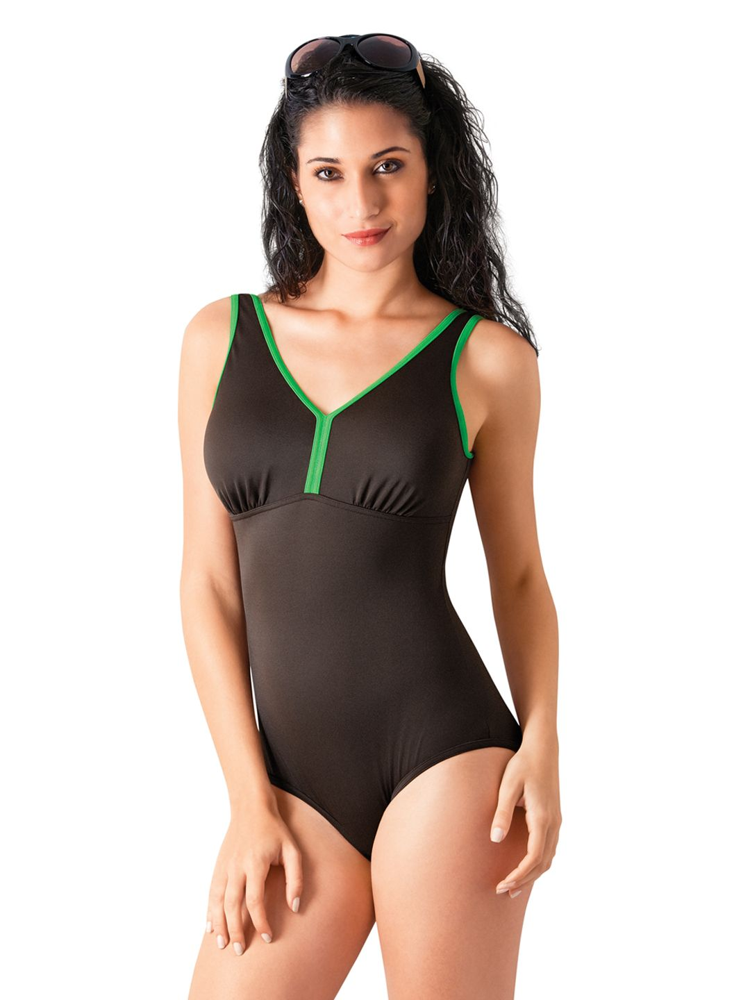

In [ ]:
item_id =42973  #Swimwear for women
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder)

Product ID: 14805, Similarity Score: 0.3363, Gender Match: Same Gender


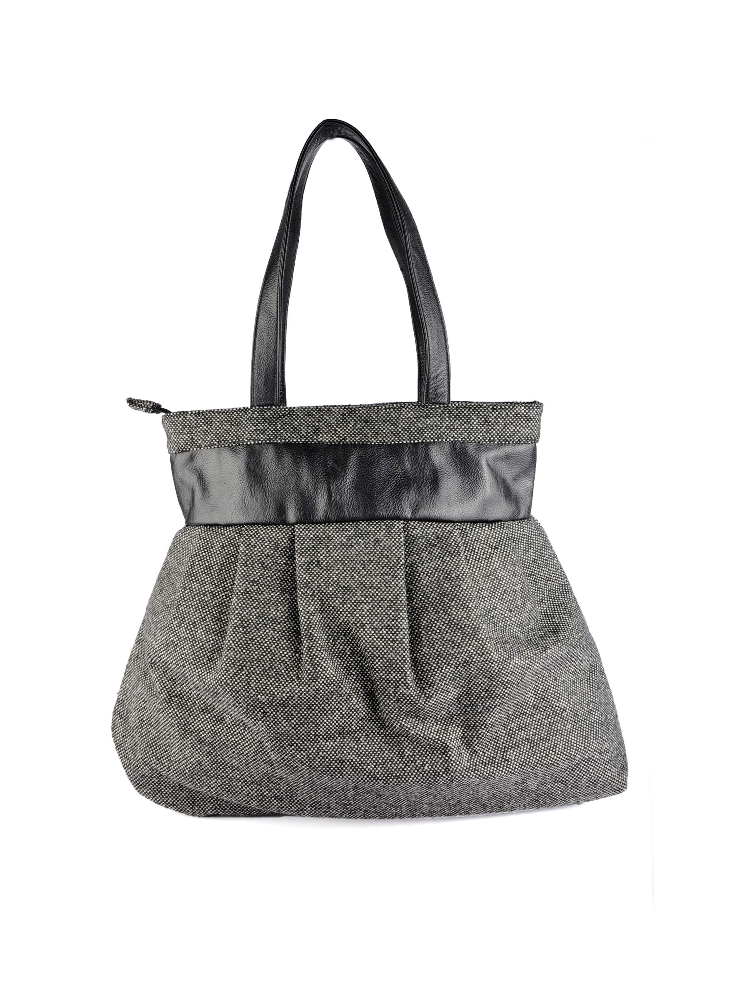

Product ID: 43814, Similarity Score: 0.3042, Gender Match: Same Gender


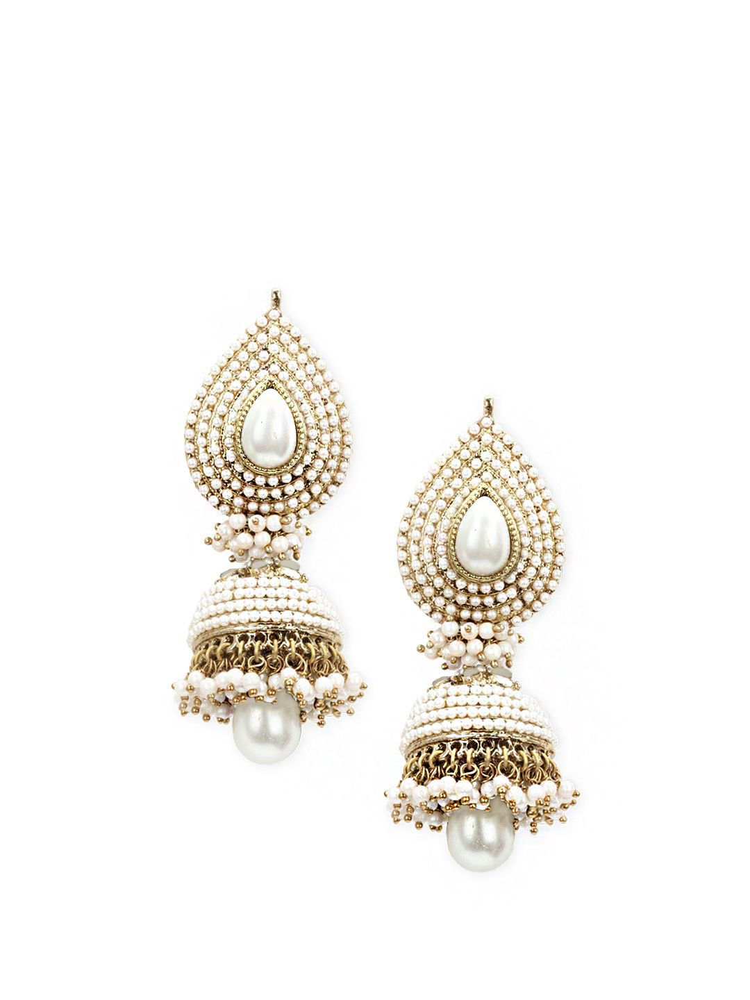

Product ID: 54147, Similarity Score: 0.3173, Gender Match: Same Gender


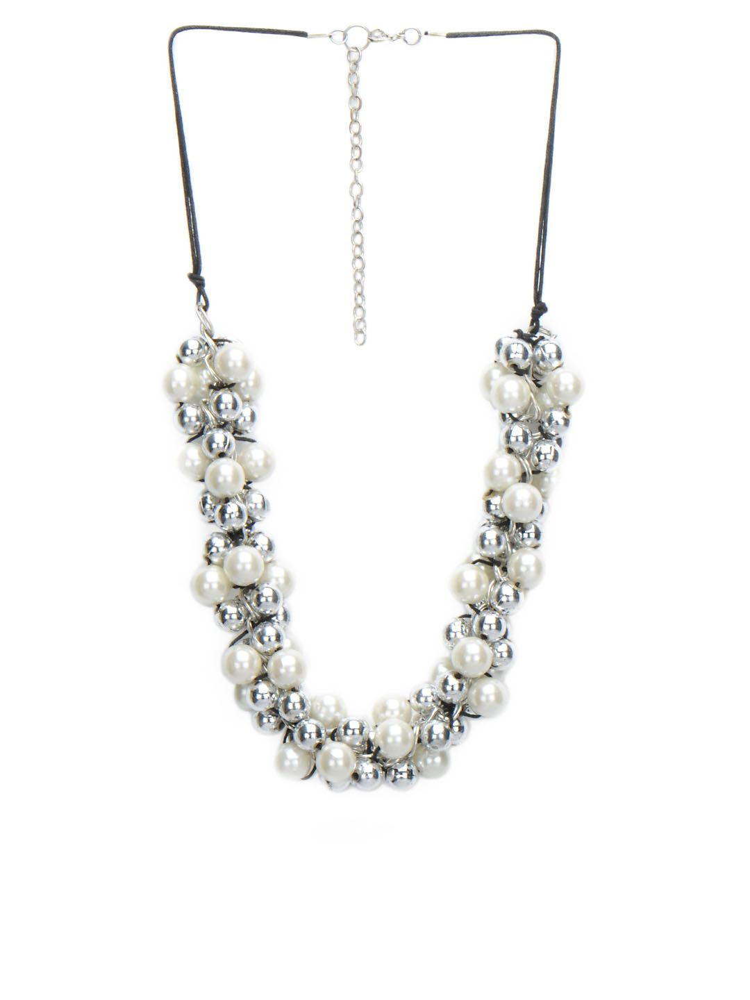

Product ID: 35788, Similarity Score: 0.3295, Gender Match: Same Gender


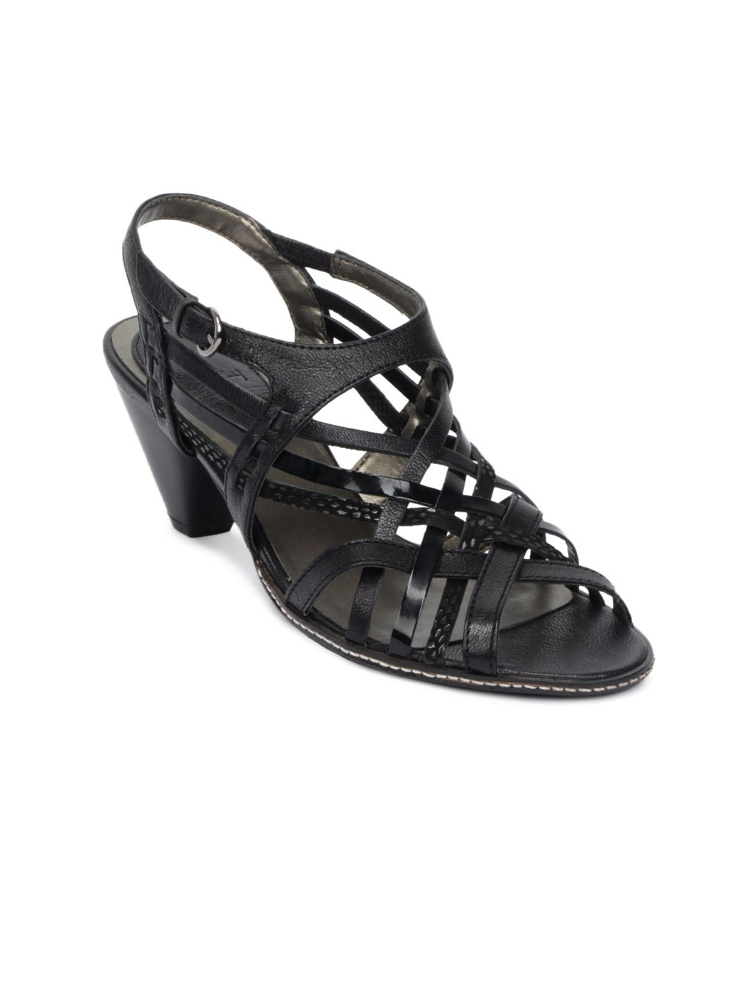

In [ ]:
#Saree
item_id =53044
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder)

Product ID: 17607, Similarity Score: -0.1477, Gender Match: Same Gender


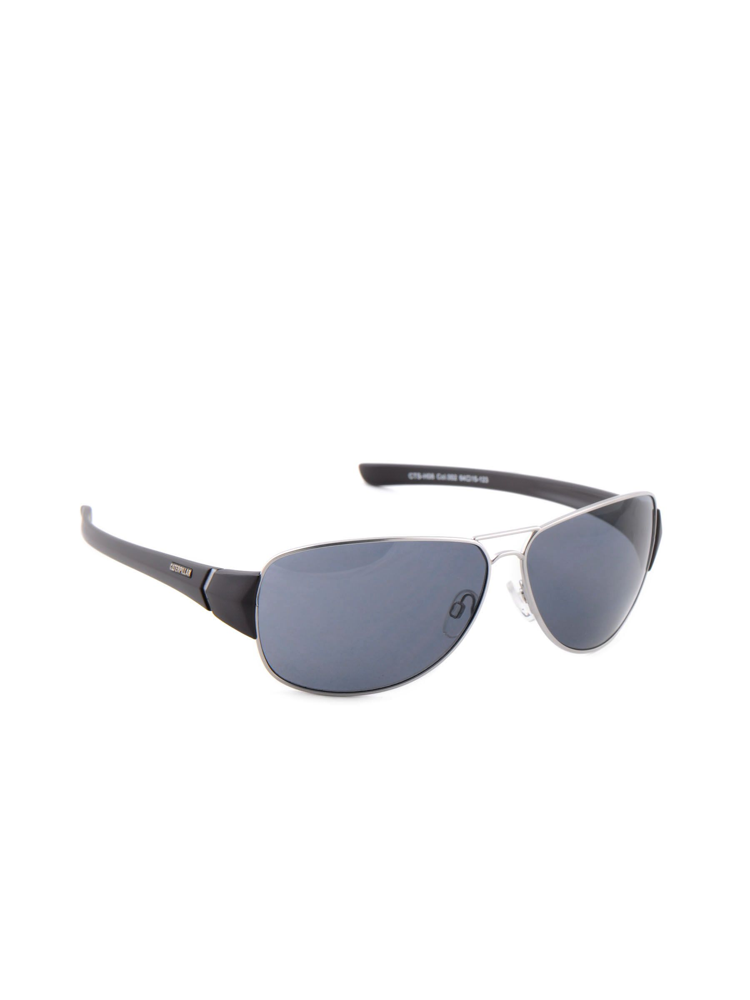

Product ID: 24809, Similarity Score: 0.5698, Gender Match: Same Gender


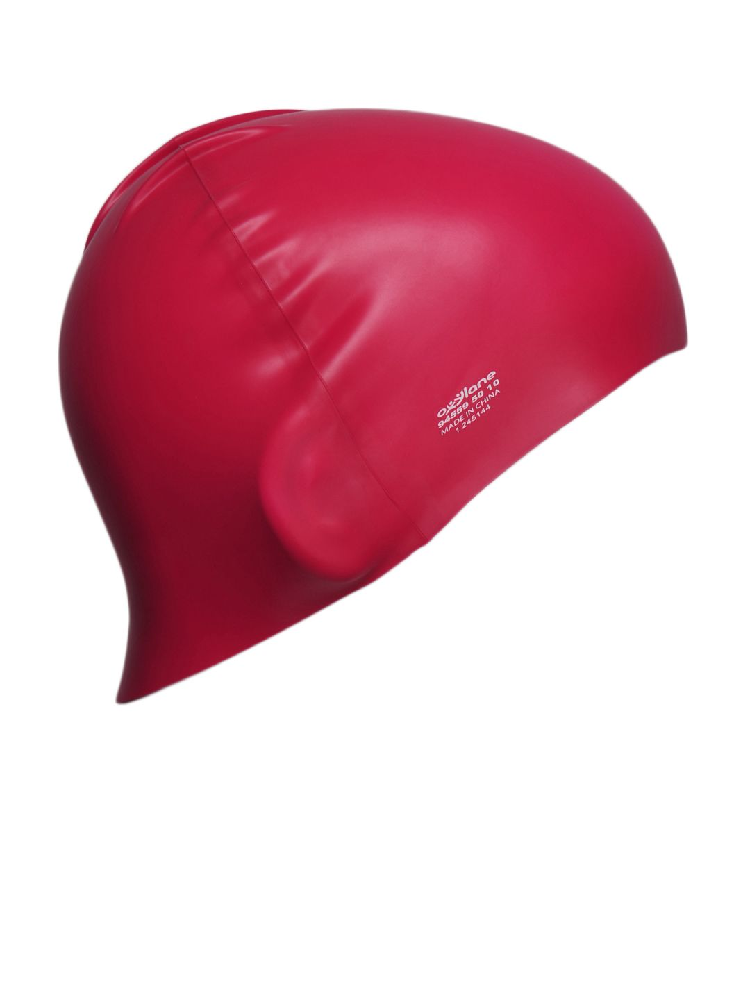

In [ ]:
item_id =1638  #Swimwear for unisex
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder)

Product ID: 53770, Similarity Score: 0.5307, Gender Match: Same Gender


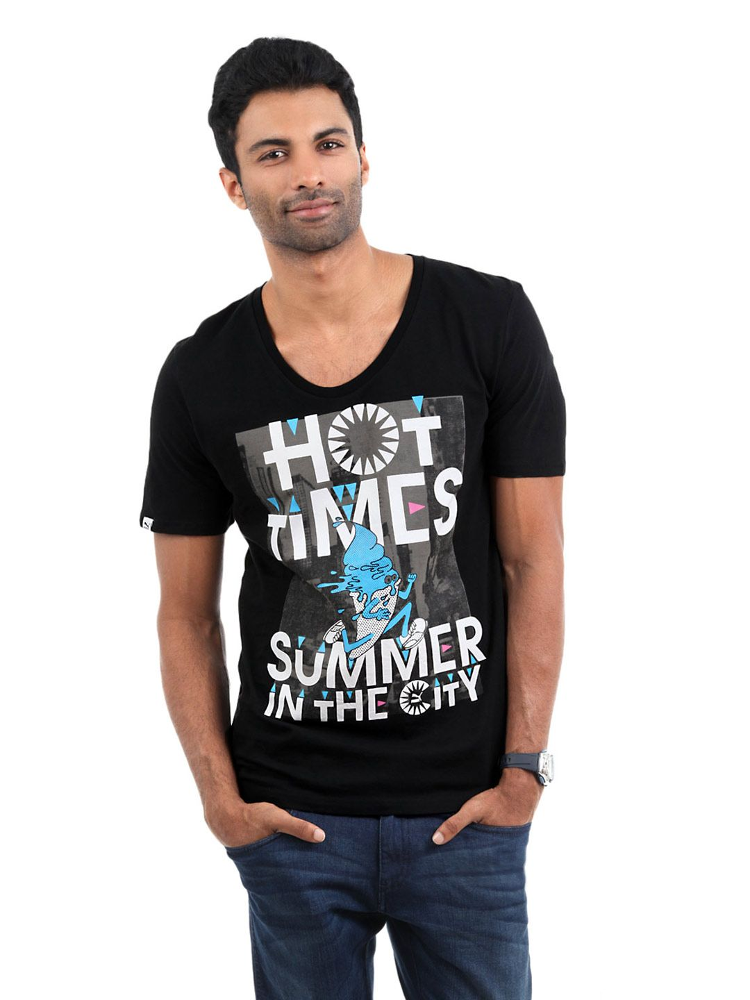

Product ID: 21583, Similarity Score: 0.3633, Gender Match: Same Gender


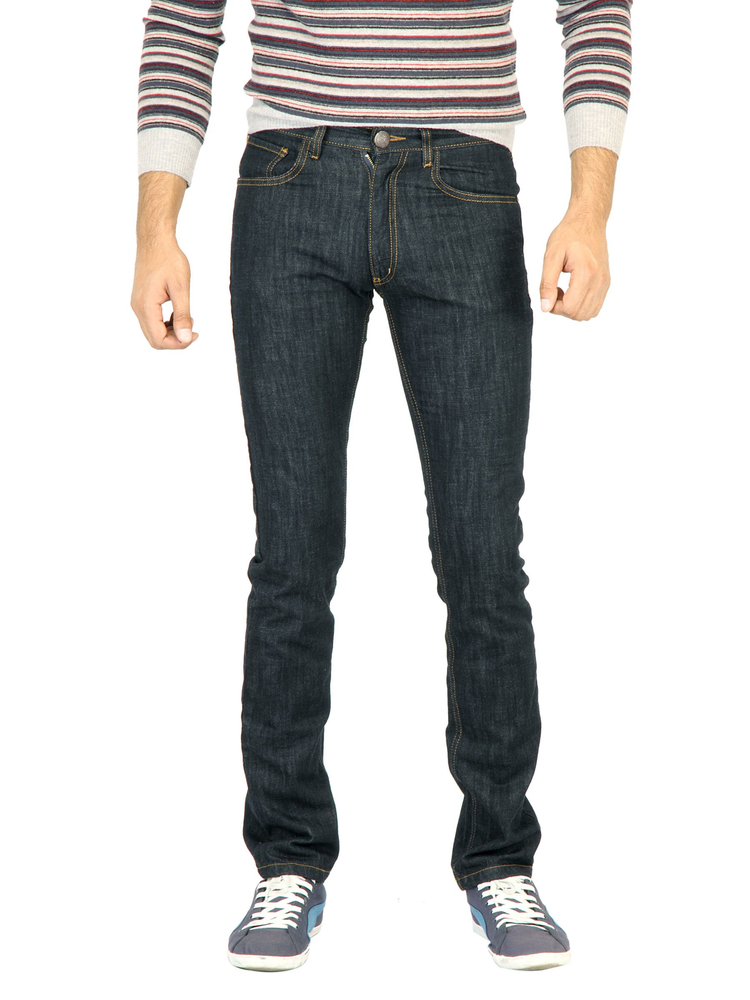

Product ID: 11198, Similarity Score: 0.5316, Gender Match: Same Gender


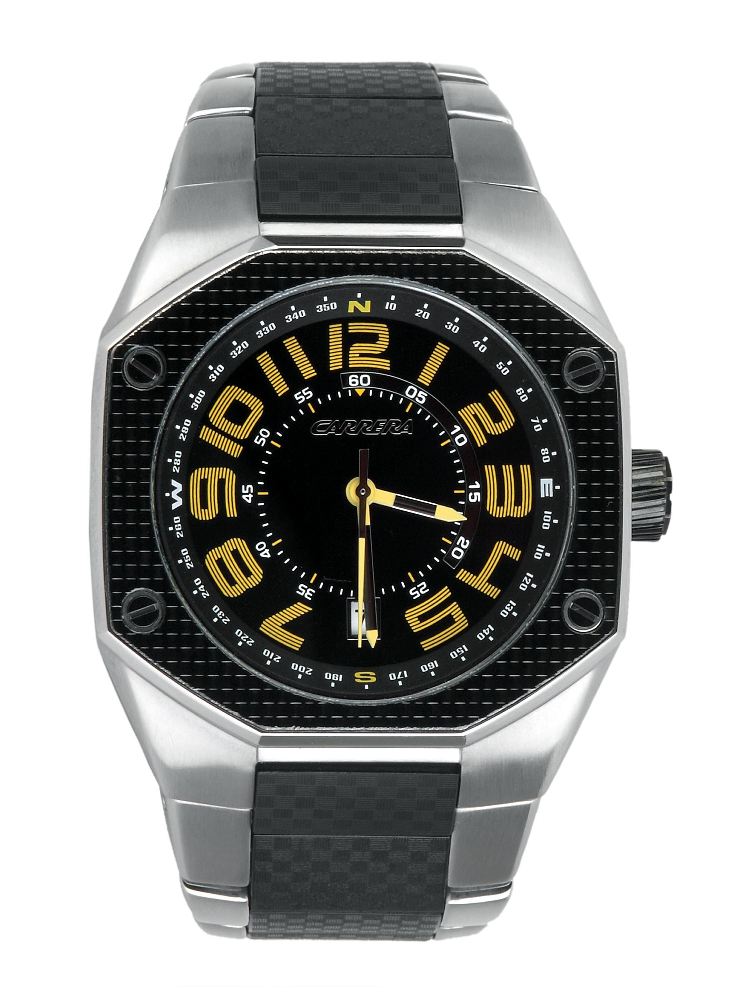

In [ ]:
item_id= 59563 #Pendant
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder)

Product ID: 37811, Similarity Score: 0.5165, Gender Match: Same Gender


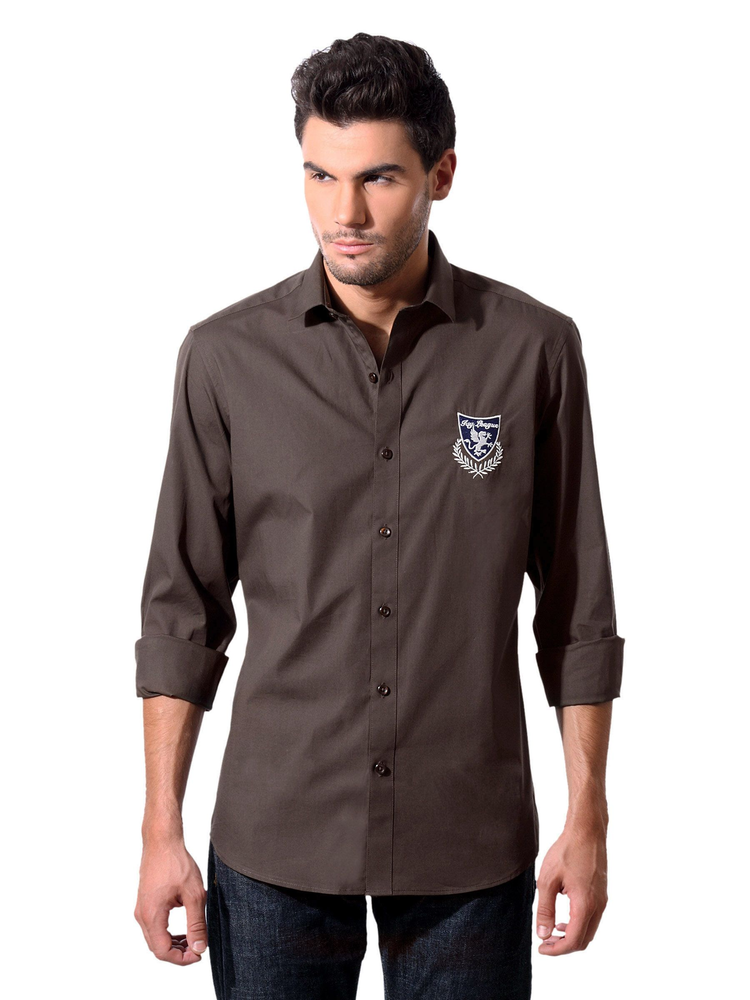

Product ID: 40521, Similarity Score: 0.3671, Gender Match: Same Gender


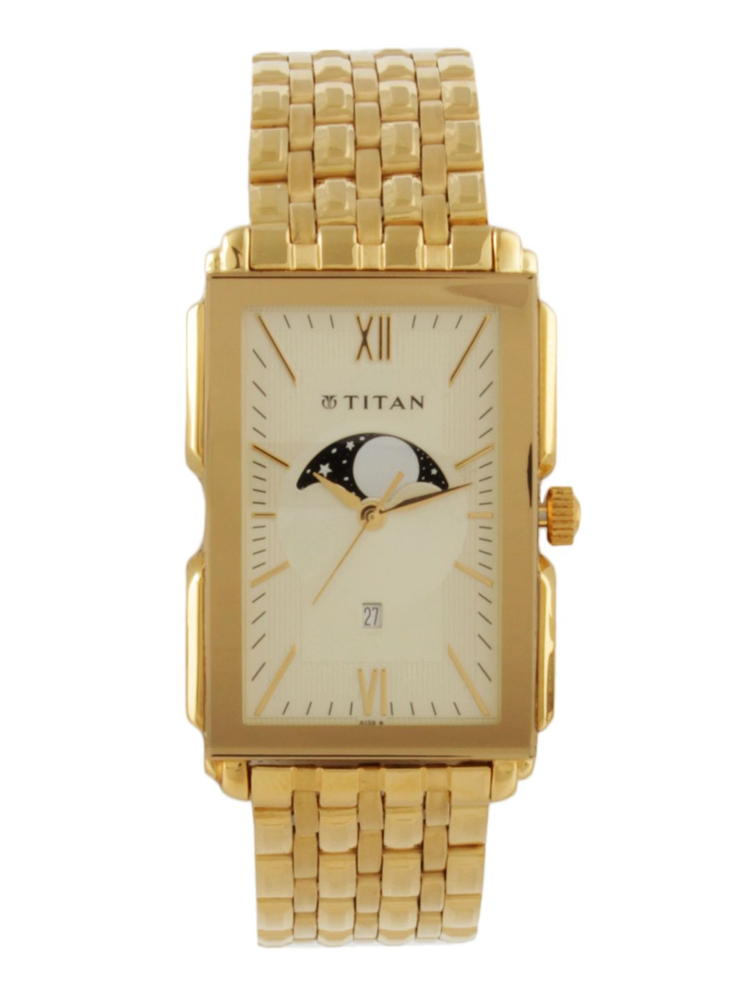

Product ID: 56822, Similarity Score: 0.5070, Gender Match: Same Gender


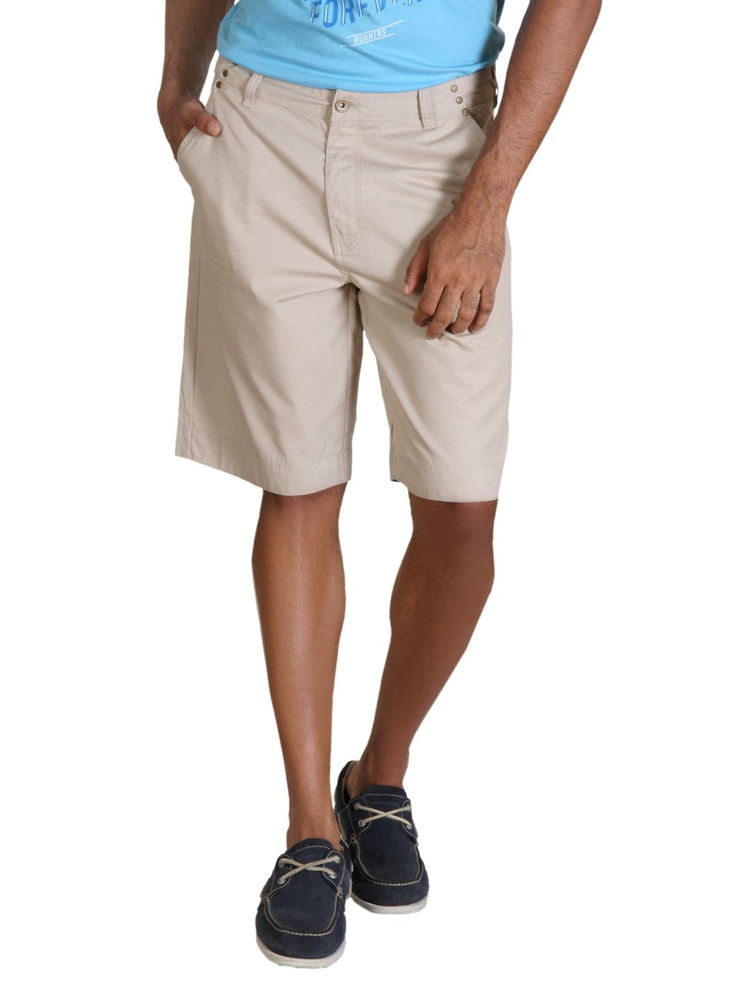

In [ ]:
#WALLETS-MEN
item_id =39557 #7615
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder)

Product ID: 27931, Similarity Score: 0.4072, Gender Match: Same Gender


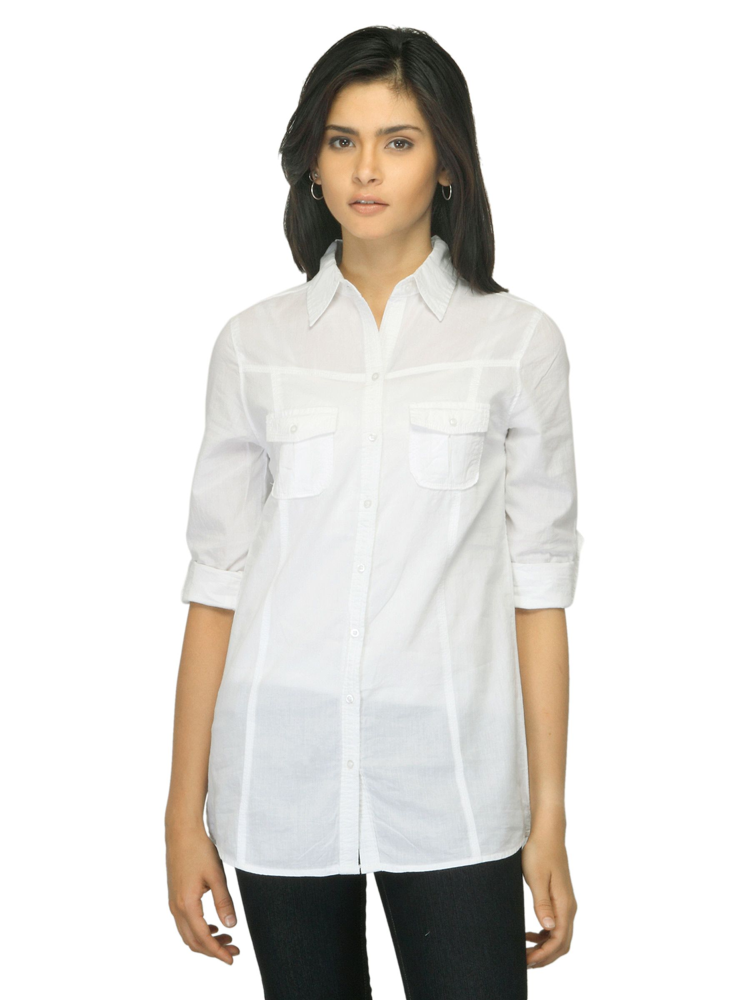

Product ID: 50956, Similarity Score: 0.3130, Gender Match: Same Gender


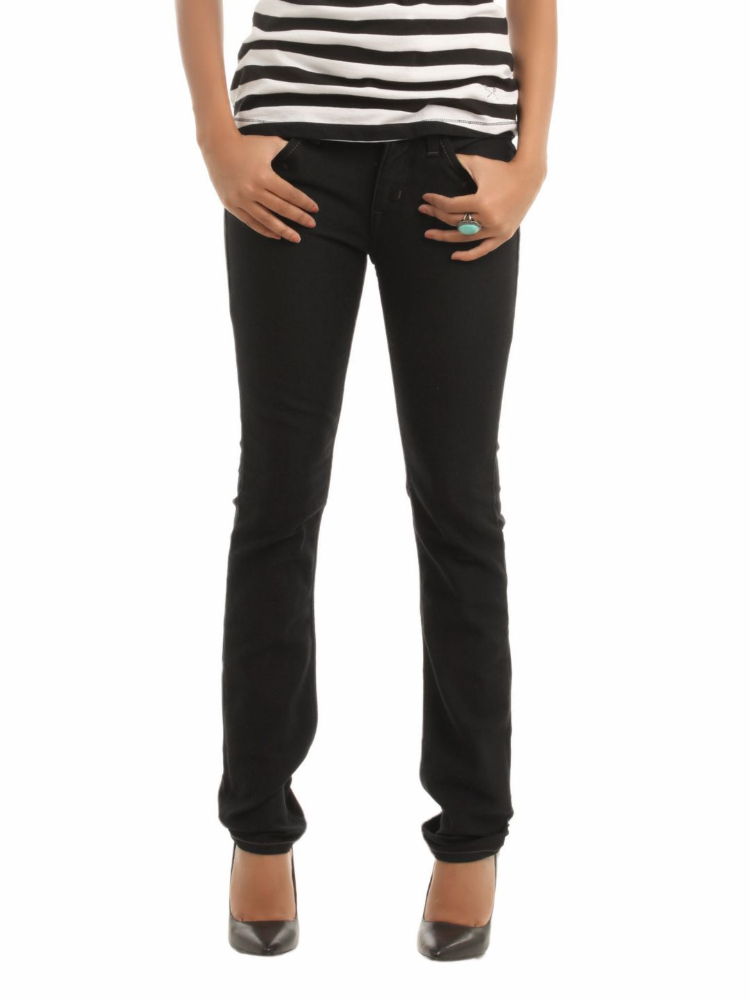

Product ID: 39593, Similarity Score: 0.5576, Gender Match: Same Gender


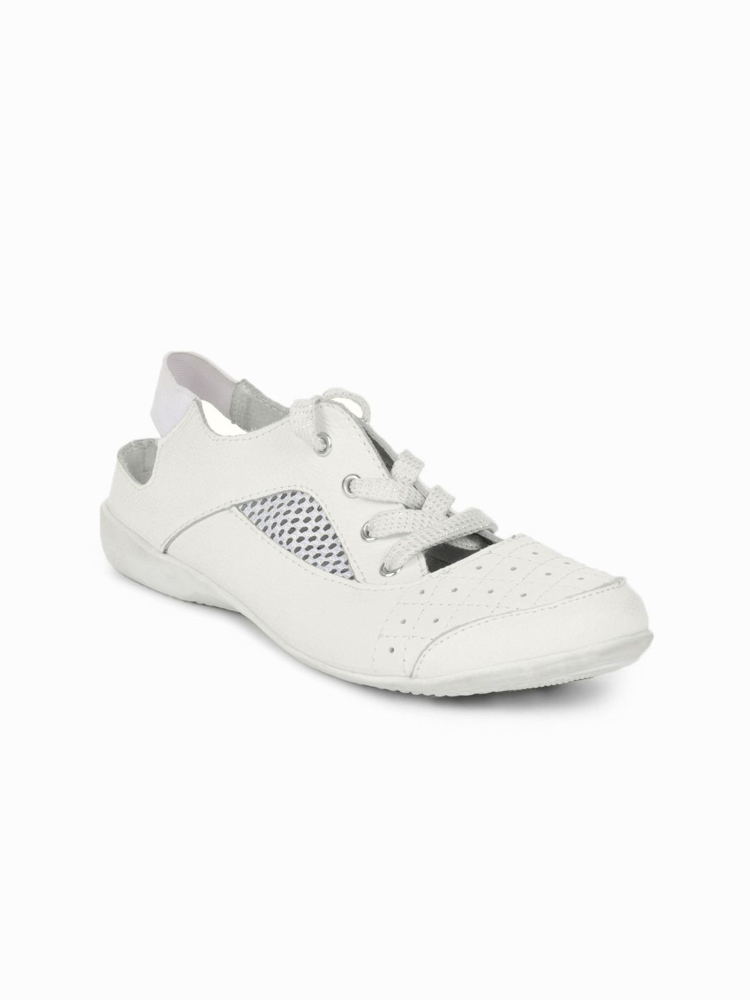

Product ID: 25102, Similarity Score: 0.5897, Gender Match: Same Gender


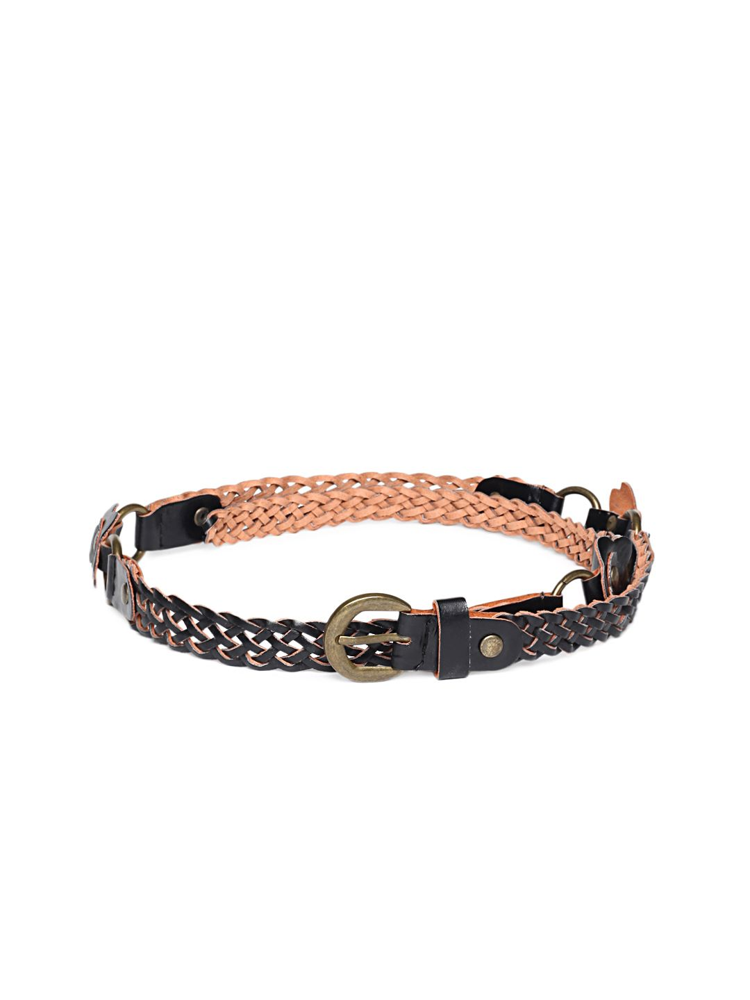

Product ID: 43648, Similarity Score: 0.1135, Gender Match: Same Gender


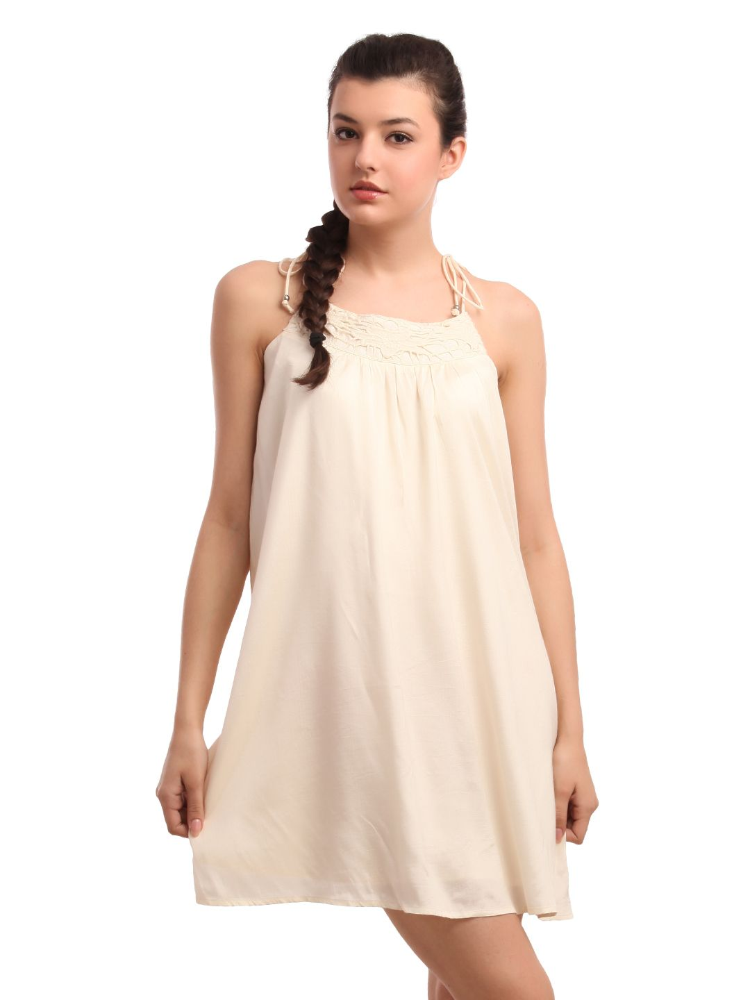

Product ID: 46135, Similarity Score: 0.6662, Gender Match: Same Gender


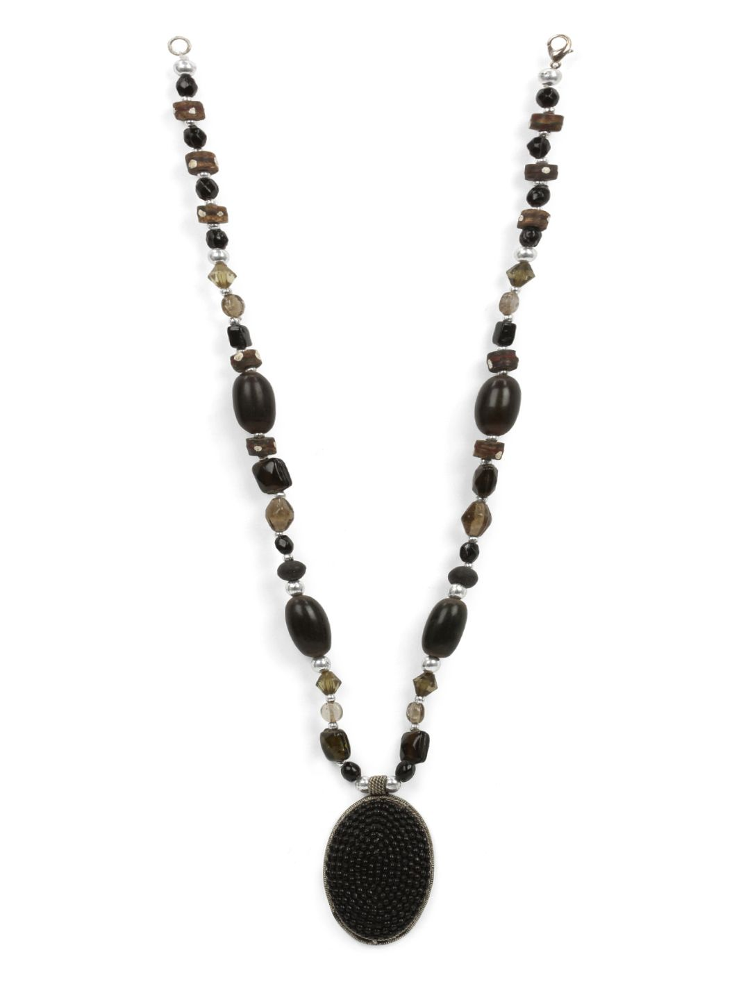

Product ID: 58611, Similarity Score: 0.6462, Gender Match: Same Gender


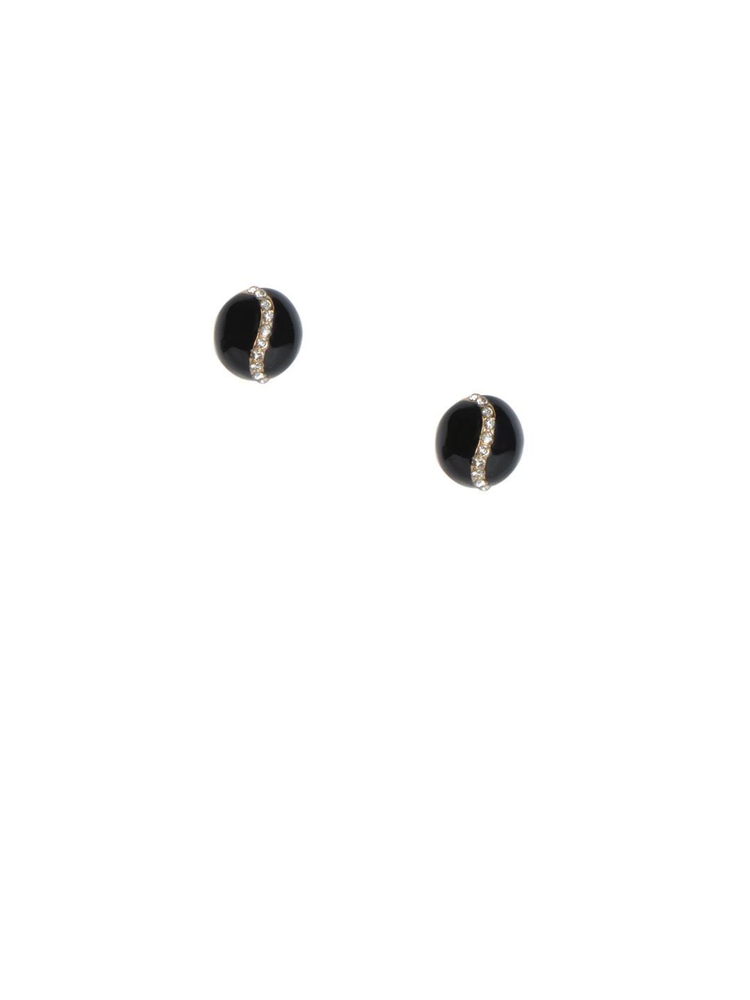

Product ID: 29977, Similarity Score: 0.6316, Gender Match: Same Gender


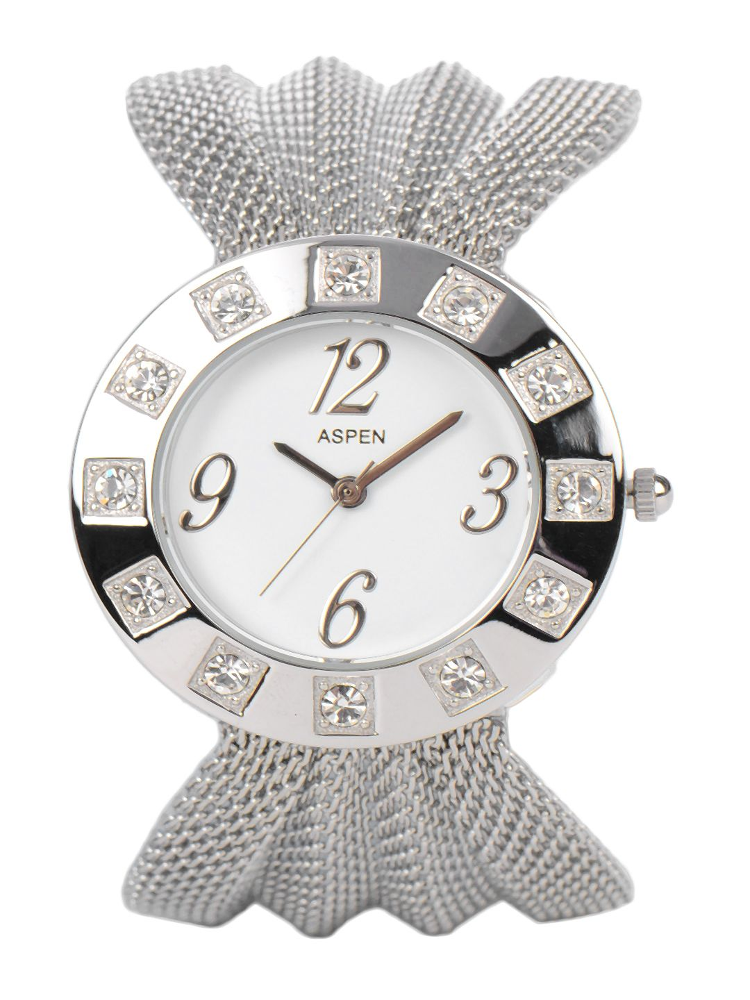

In [ ]:
item_id =59776 # bracelet for women
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder)

In [ ]:
item_id =48743 # bangle for women
get_diverse_complementary_recommendations(item_id, df, final_features, image_folder)

No recommendations found.


Product ID: 3710, Similarity Score: 0.2558, Gender Match: Same Gender


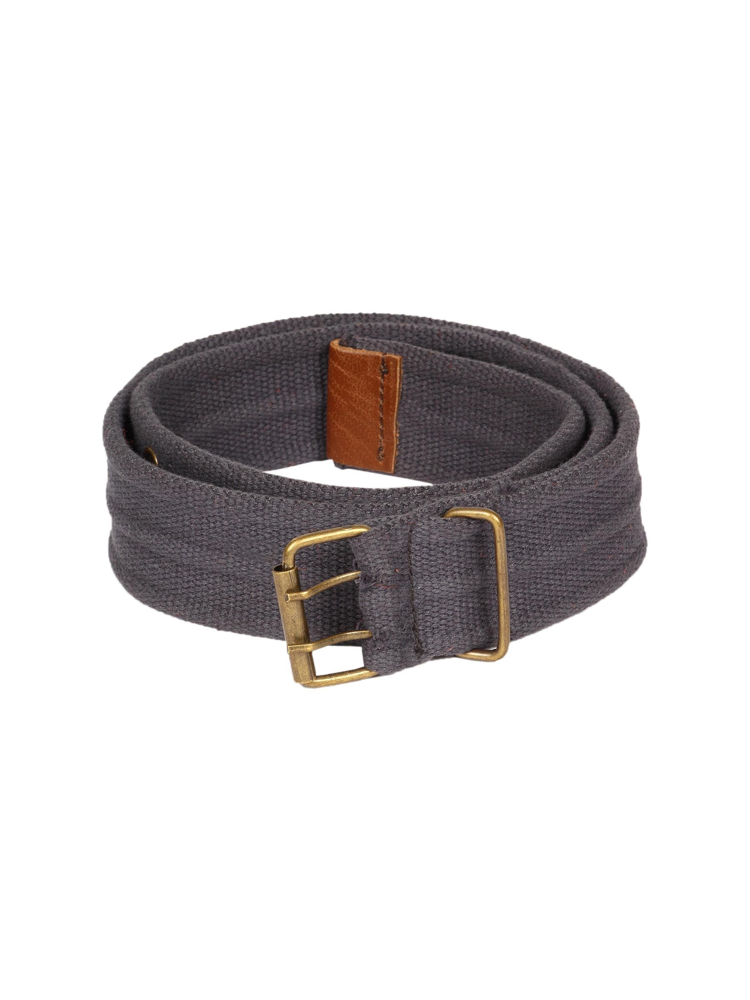

Product ID: 36792, Similarity Score: 0.1219, Gender Match: Same Gender


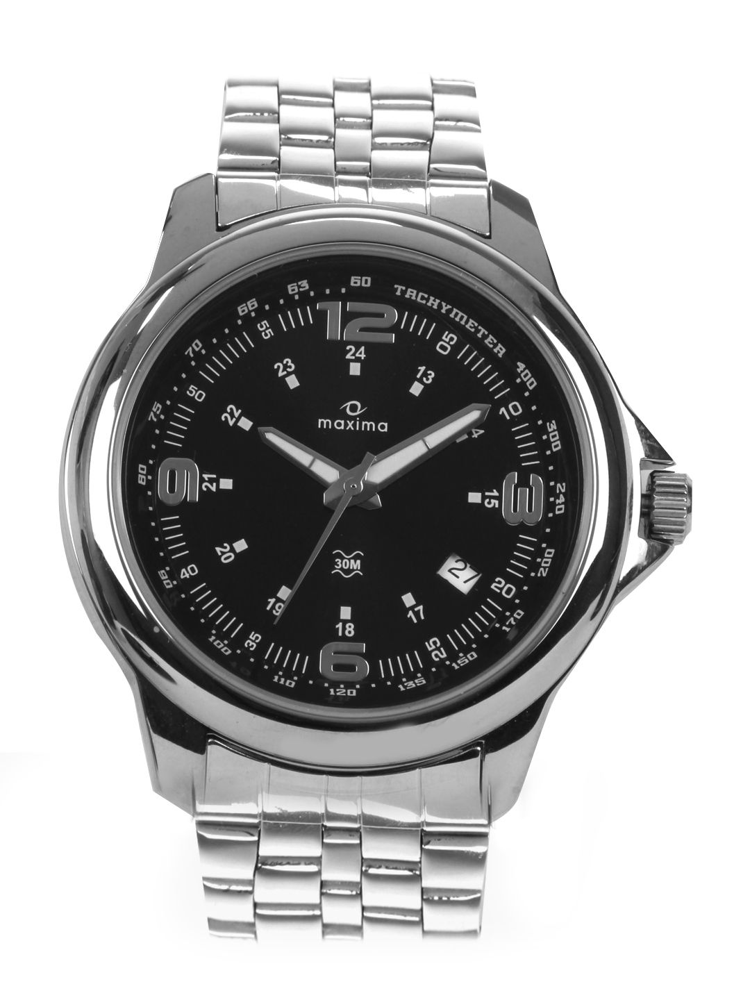

Product ID: 11896, Similarity Score: 0.2445, Gender Match: Same Gender


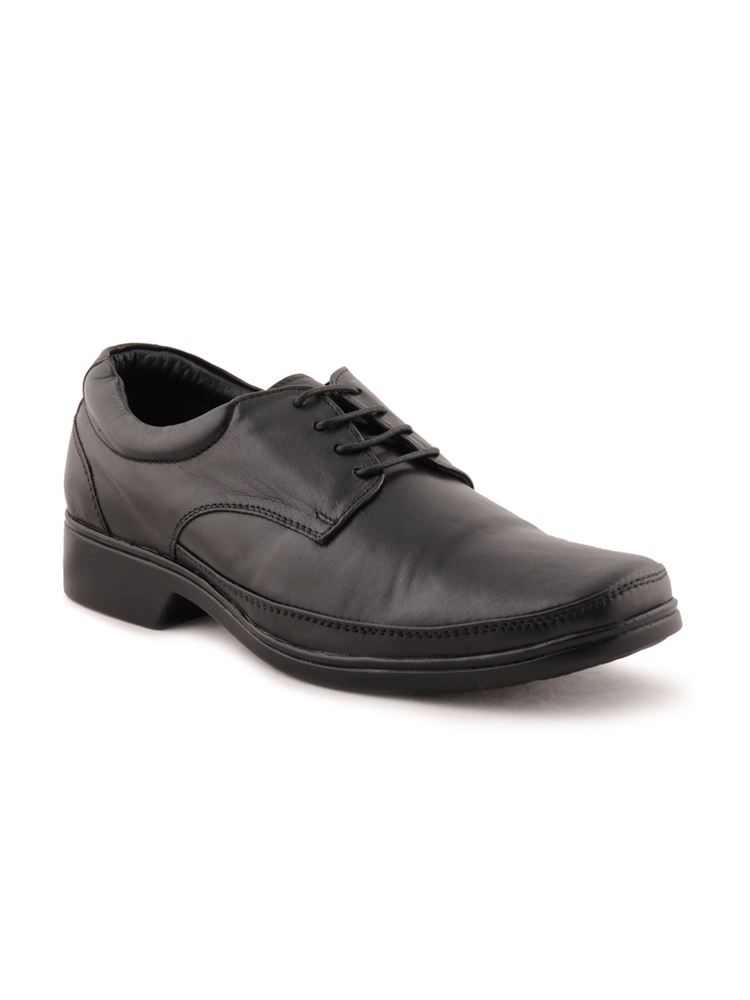